In [2]:
import sys, os
import matplotlib.pyplot as plt
sys.path.append('../')
from sklearn.metrics import mean_squared_error
import re
import numpy as np

In [7]:
from functools import partial

In [3]:
import torch

In [14]:
from core.models import rUNet
from core.utils.inference import inference_phase_rUNet_plot_notebook
from core.utils.data import define_dataset, select_dist

/storage/yw18581/src/env_dir/mlearning/lib/python3.7/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)


In [4]:
%matplotlib inline

In [5]:
regex=re.compile(r'\d+')

In [6]:
saved_models = '/storage/yw18581/src/leaf_reco/saved_models/trained_6positions_multi_loss/'

In [8]:
root_path = partial(os.path.join, saved_models)

In [9]:
data_folder = ('/storage/yw18581/data/dataset/')

In [10]:
model_names = os.listdir(saved_models)

In [11]:
def get_fnames(coeff, prefix='Trained'):
    idx_coef = 6 if prefix=='Trained' else 4
    idx_epoch = 5 if prefix =='Trained' else 3
    f_list = []
    epochs = []
    for fname in model_names:
        if fname.startswith(prefix):
            if regex.findall(fname.split("_")[idx_coef])[1]==str(coeff):
                epoch = int(regex.findall(fname.split("_")[idx_epoch])[0]) 
                epochs.append(epoch)
                if int(regex.findall(fname.split("_")[idx_epoch])[0])==epoch:
                    f_list.append(fname)
    
    return np.array(f_list)[np.argsort(epochs)], np.sort(epochs)

In [12]:
training_dist = [2,4,10,20,25,35]
unseen_dist = [1,3,15,30]

In [16]:
selected_distances = select_dist(dist_list=unseen_dist, root_folder=data_folder)

In [20]:
data_loaders_mask, data_length_mask = define_dataset(data_folder, batch_size=1,
                                                    include_list=selected_distances,
                                                     alldata=False, load_mask=True)

In [33]:
def predict_coef_epoch(coeff, epoch):
    filelist, epochs = get_fnames(coeff)
    model_fname = filelist[int(np.argwhere(epochs==epoch)[0])]
    print(model_fname)
    torch.cuda.empty_cache()
    model = rUNet(out_size=1)
    checkpoint = torch.load(root_path(model_fname))['model_state_dict']
    #print(checkpoint)
    model.load_state_dict(checkpoint)
    
    print('Checkpoint loaded')
    inference_phase_rUNet_plot_notebook(model, data_loaders_mask, data_length_mask,
                                       batch_size=1, stop=10, test=True)

    return 

Trained_rUNet_pytorch_6positions_dataset_5epochs_0.5coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 1, pred_dist: [5.5737634]


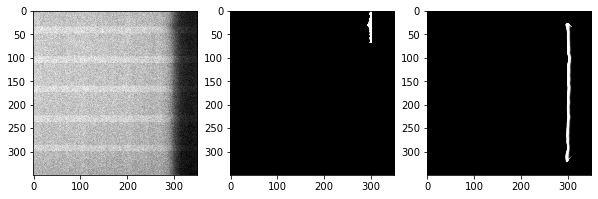

batch 2
1: true_dist: 1, pred_dist: [5.579537]


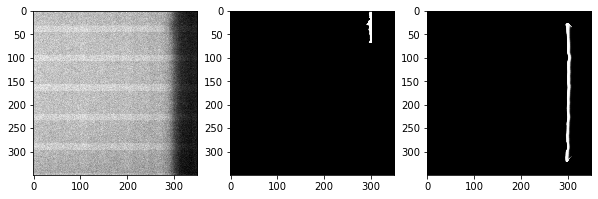

Trained_rUNet_pytorch_6positions_dataset_10epochs_0.5coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 3, pred_dist: [5.5185995]


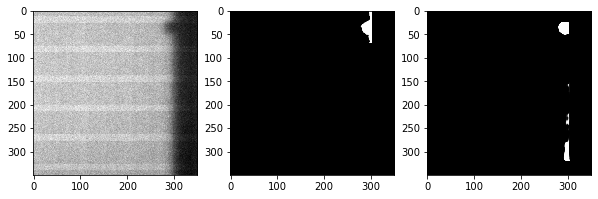

batch 2
1: true_dist: 1, pred_dist: [5.48701]


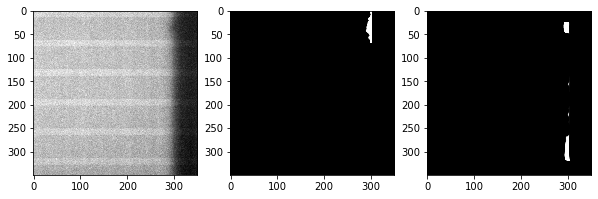

Trained_rUNet_pytorch_6positions_dataset_15epochs_0.5coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 30, pred_dist: [5.033563]


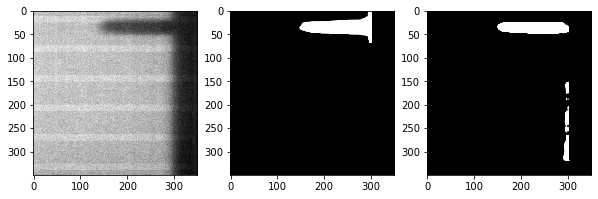

batch 2
1: true_dist: 15, pred_dist: [5.1264124]


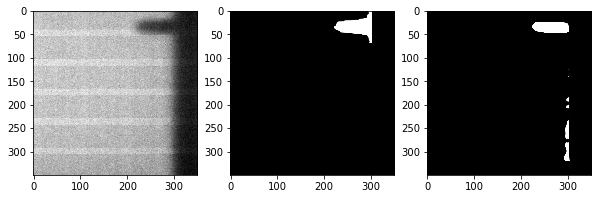

Trained_rUNet_pytorch_6positions_dataset_20epochs_0.5coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 15, pred_dist: [4.753756]





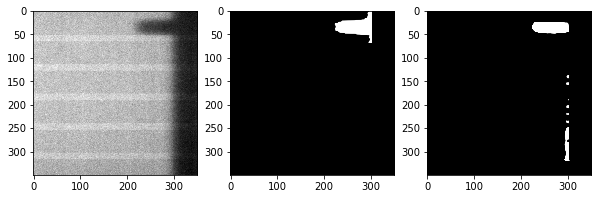

batch 2
1: true_dist: 1, pred_dist: [4.93954]


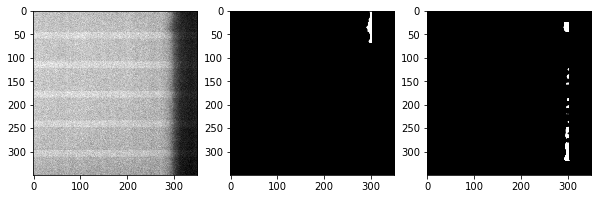

Trained_rUNet_pytorch_6positions_dataset_25epochs_0.5coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 15, pred_dist: [4.2126575]


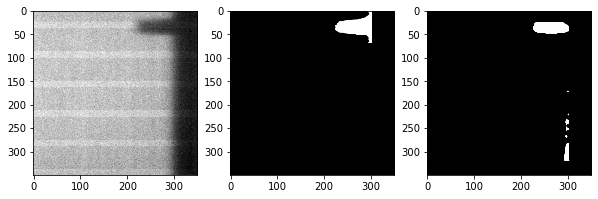

batch 2
1: true_dist: 3, pred_dist: [5.108185]


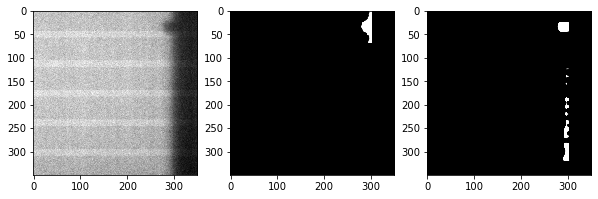

Trained_rUNet_pytorch_6positions_dataset_30epochs_0.5coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 15, pred_dist: [3.76776]


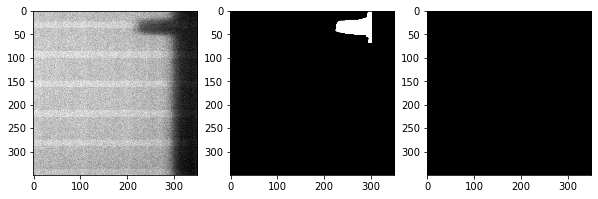

batch 2
1: true_dist: 1, pred_dist: [4.1763644]


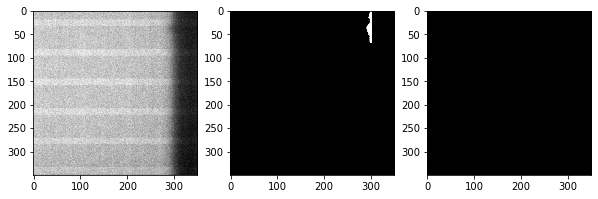

Trained_rUNet_pytorch_6positions_dataset_35epochs_0.5coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 30, pred_dist: [3.2493675]


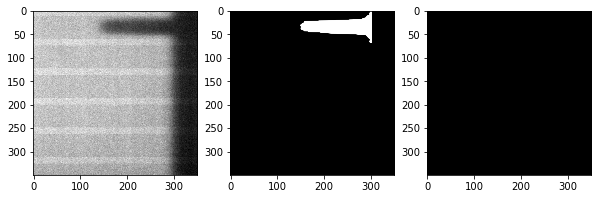

batch 2
1: true_dist: 3, pred_dist: [3.7017555]


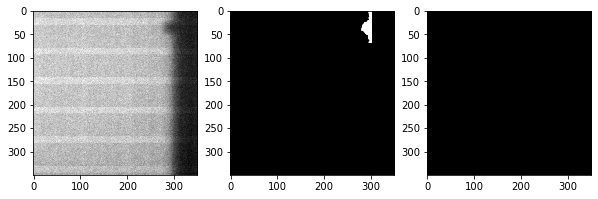

Trained_rUNet_pytorch_6positions_dataset_40epochs_0.5coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 1, pred_dist: [3.386959]


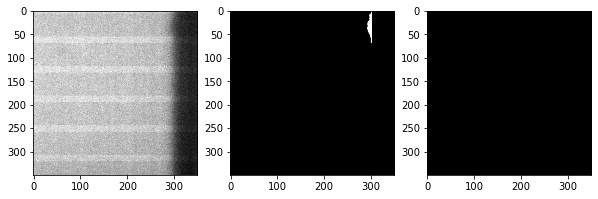

batch 2
1: true_dist: 15, pred_dist: [3.0968244]


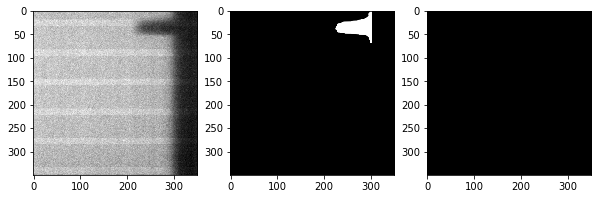

Trained_rUNet_pytorch_6positions_dataset_45epochs_0.5coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 3, pred_dist: [3.0911424]


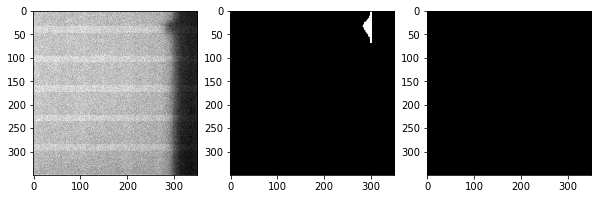

batch 2
1: true_dist: 1, pred_dist: [3.162232]


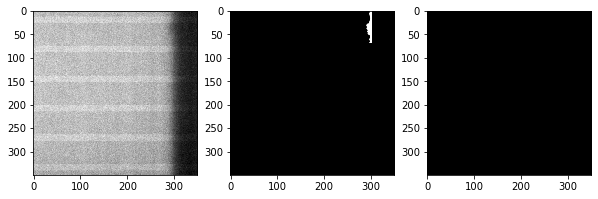

Trained_rUNet_pytorch_6positions_dataset_50epochs_0.5coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 3, pred_dist: [3.0945103]


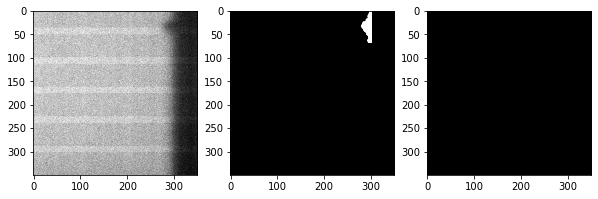

batch 2
1: true_dist: 15, pred_dist: [2.5869946]


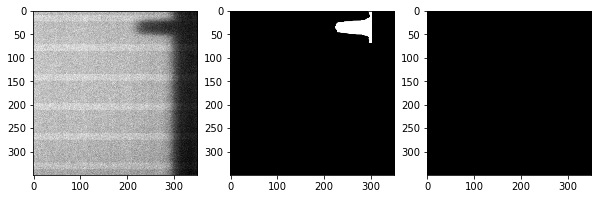

Trained_rUNet_pytorch_6positions_dataset_55epochs_0.5coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 30, pred_dist: [2.1301372]





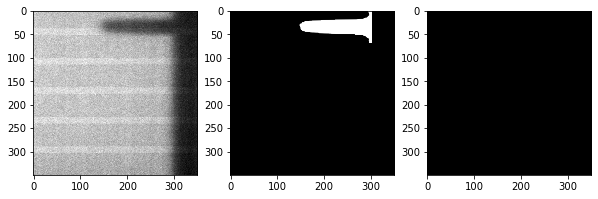

batch 2
1: true_dist: 15, pred_dist: [2.4048755]


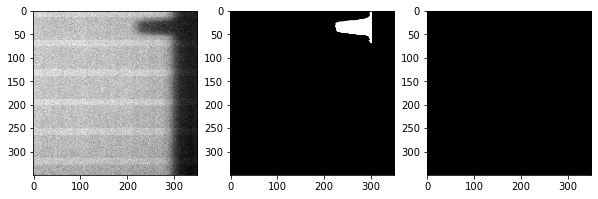

Trained_rUNet_pytorch_6positions_dataset_60epochs_0.5coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 15, pred_dist: [2.5062718]


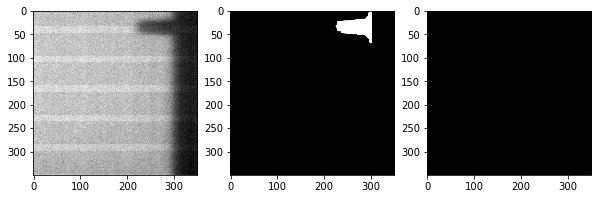

batch 2
1: true_dist: 30, pred_dist: [2.116332]


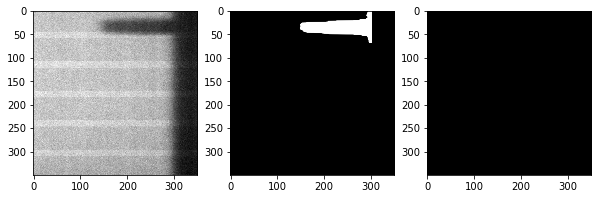

Trained_rUNet_pytorch_6positions_dataset_65epochs_0.5coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 15, pred_dist: [2.2769449]


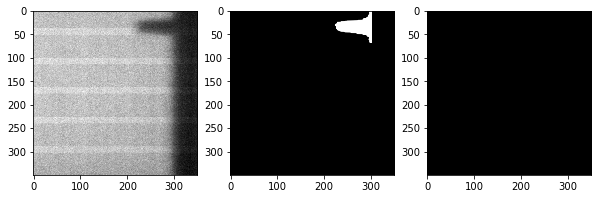

batch 2
1: true_dist: 30, pred_dist: [1.8757198]


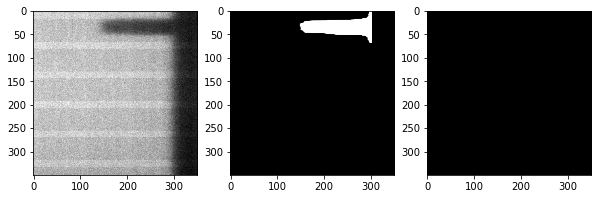

Trained_rUNet_pytorch_6positions_dataset_70epochs_0.5coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 15, pred_dist: [2.254927]


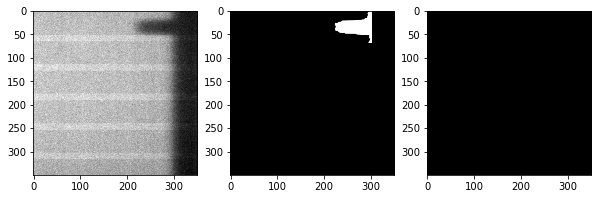

batch 2
1: true_dist: 15, pred_dist: [2.250693]


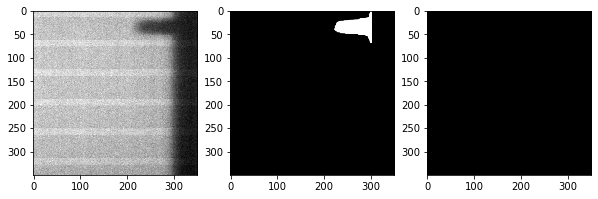

Trained_rUNet_pytorch_6positions_dataset_75epochs_0.5coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 3, pred_dist: [2.590755]


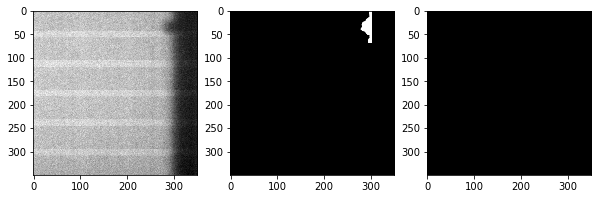

batch 2
1: true_dist: 3, pred_dist: [2.4588084]


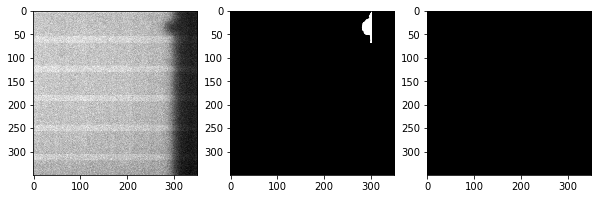

Trained_rUNet_pytorch_6positions_dataset_80epochs_0.5coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 1, pred_dist: [2.422038]


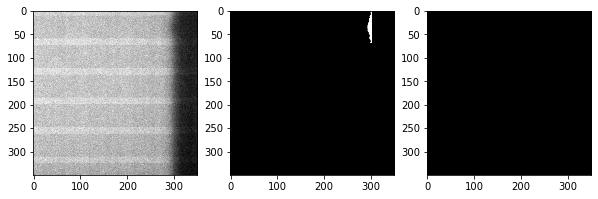

batch 2
1: true_dist: 15, pred_dist: [2.1325738]


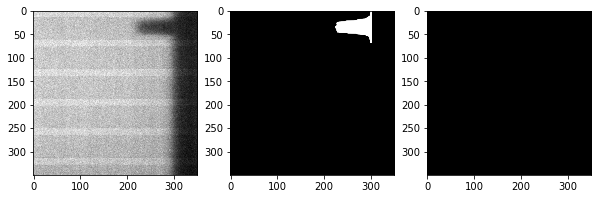

Trained_rUNet_pytorch_6positions_dataset_85epochs_0.5coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 1, pred_dist: [2.4902618]


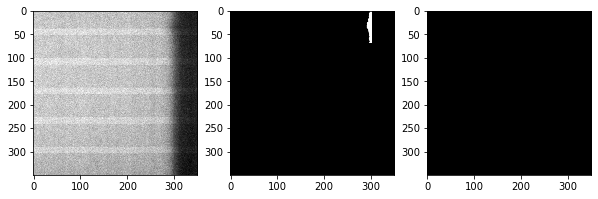

batch 2
1: true_dist: 15, pred_dist: [2.195528]


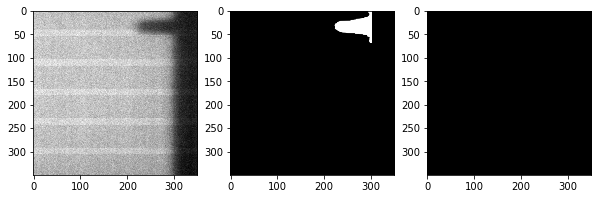

Trained_rUNet_pytorch_6positions_dataset_90epochs_0.5coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 15, pred_dist: [2.2504053]





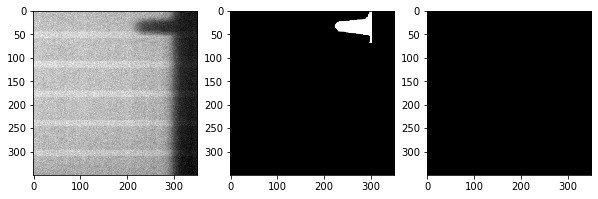

batch 2
1: true_dist: 15, pred_dist: [2.1655004]


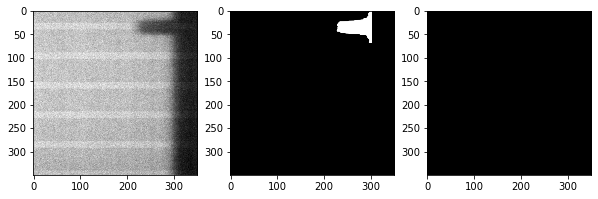

Trained_rUNet_pytorch_6positions_dataset_95epochs_0.5coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 1, pred_dist: [2.5699549]


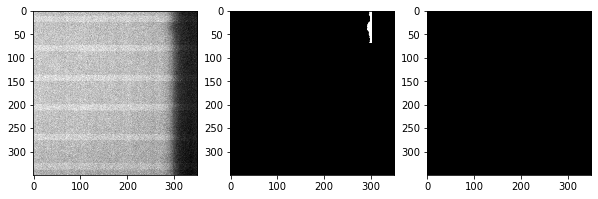

batch 2
1: true_dist: 1, pred_dist: [2.721004]


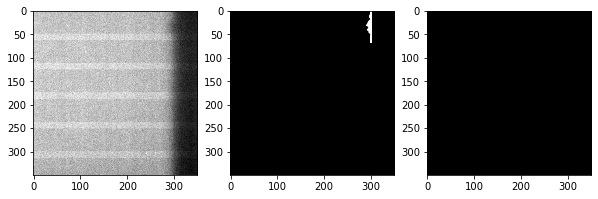

In [25]:
for ep in range(5, 100, 5):
    predict_coef_epoch(coeff=5, epoch=ep)

Trained_rUNet_pytorch_6positions_dataset_5epochs_0.4coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 30, pred_dist: [3.946545]


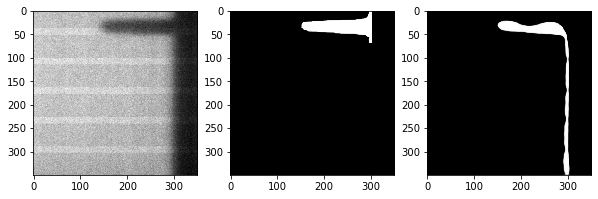

batch 2
1: true_dist: 1, pred_dist: [4.1255994]


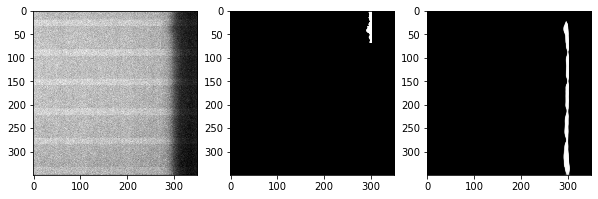

Trained_rUNet_pytorch_6positions_dataset_10epochs_0.4coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 30, pred_dist: [3.3026927]


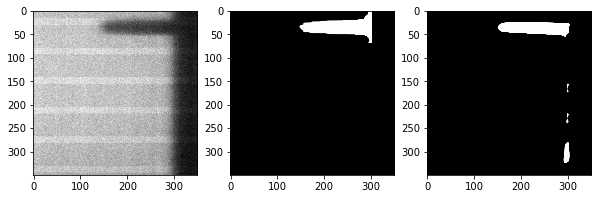

batch 2
1: true_dist: 30, pred_dist: [3.145486]


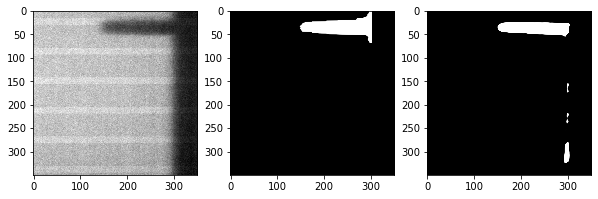

Trained_rUNet_pytorch_6positions_dataset_15epochs_0.4coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 30, pred_dist: [2.899507]


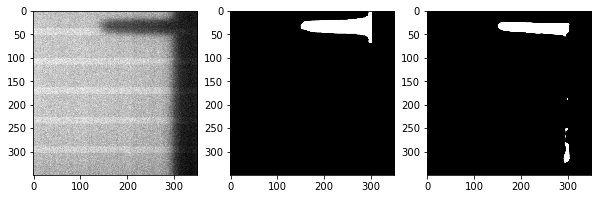

batch 2
1: true_dist: 1, pred_dist: [3.1965623]


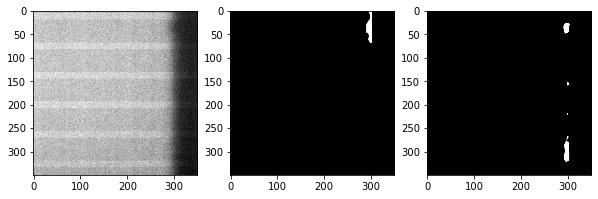

Trained_rUNet_pytorch_6positions_dataset_20epochs_0.4coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 15, pred_dist: [2.3947835]


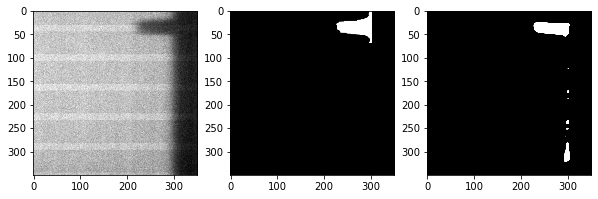

batch 2
1: true_dist: 30, pred_dist: [2.2229505]


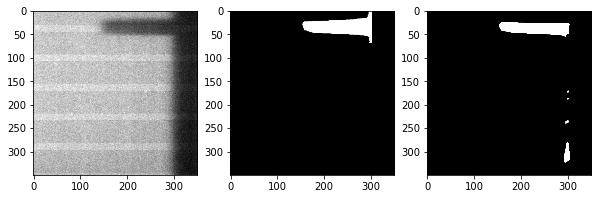

Trained_rUNet_pytorch_6positions_dataset_25epochs_0.4coeff_mask.pkl


Checkpoint loaded


batch 1
1: true_dist: 15, pred_dist: [2.0031812]


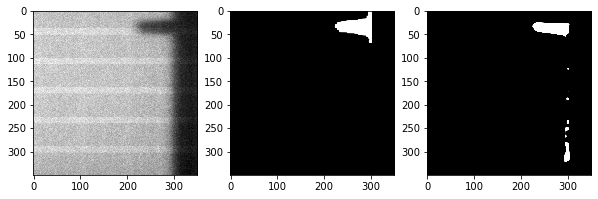

batch 2
1: true_dist: 15, pred_dist: [1.9667101]


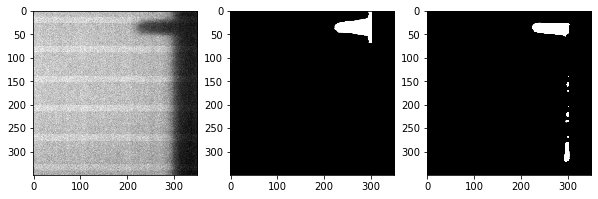

Trained_rUNet_pytorch_6positions_dataset_30epochs_0.4coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 15, pred_dist: [1.6296667]


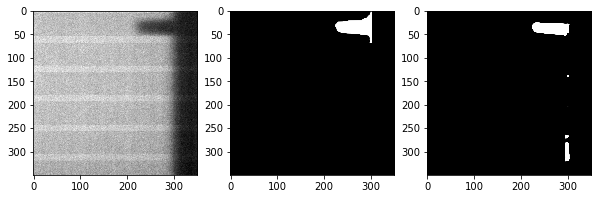

batch 2
1: true_dist: 30, pred_dist: [1.4660155]


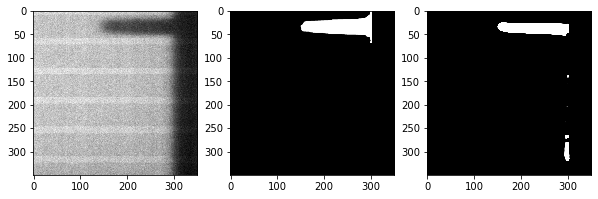

Trained_rUNet_pytorch_6positions_dataset_35epochs_0.4coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 3, pred_dist: [1.3185637]


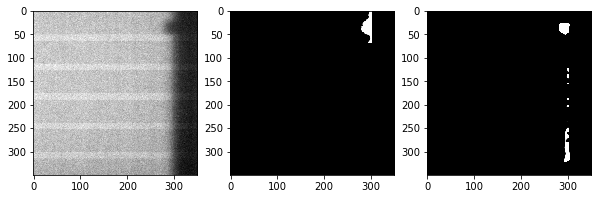

batch 2
1: true_dist: 30, pred_dist: [1.1287444]


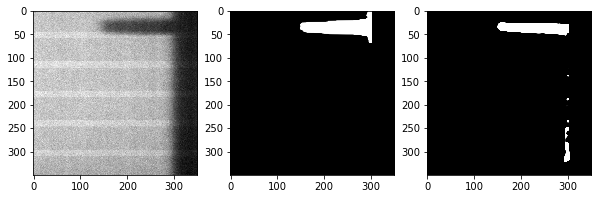

Trained_rUNet_pytorch_6positions_dataset_40epochs_0.4coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 1, pred_dist: [0.88327277]





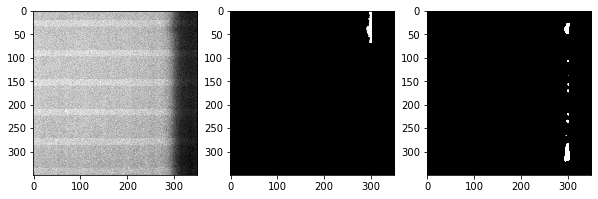

batch 2
1: true_dist: 15, pred_dist: [0.7697009]


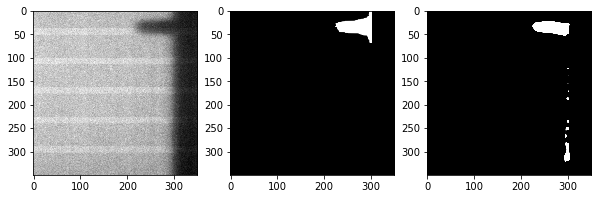

Trained_rUNet_pytorch_6positions_dataset_45epochs_0.4coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 15, pred_dist: [0.7213437]


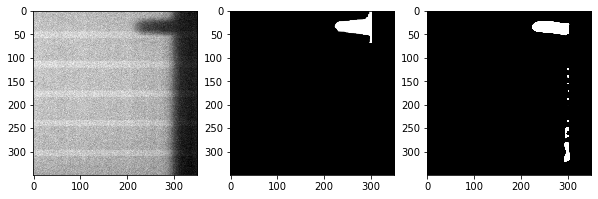

batch 2
1: true_dist: 1, pred_dist: [0.6437412]


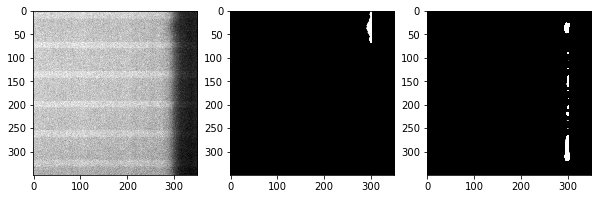

Trained_rUNet_pytorch_6positions_dataset_50epochs_0.4coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 1, pred_dist: [0.66333795]


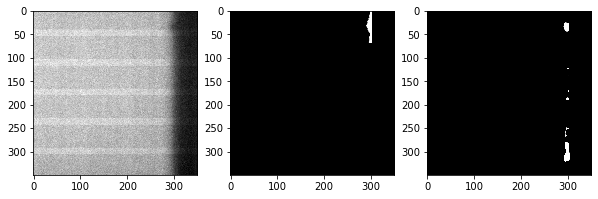

batch 2
1: true_dist: 15, pred_dist: [0.5379093]


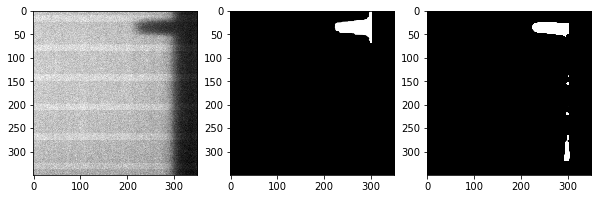

Trained_rUNet_pytorch_6positions_dataset_55epochs_0.4coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 3, pred_dist: [0.5200385]


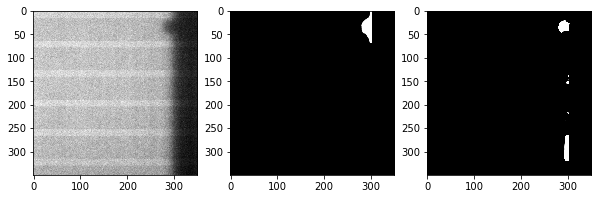

batch 2
1: true_dist: 15, pred_dist: [0.391586]


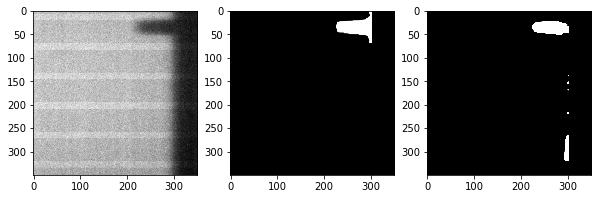

Trained_rUNet_pytorch_6positions_dataset_60epochs_0.4coeff_mask.pkl


Checkpoint loaded


batch 1
1: true_dist: 15, pred_dist: [0.29117525]


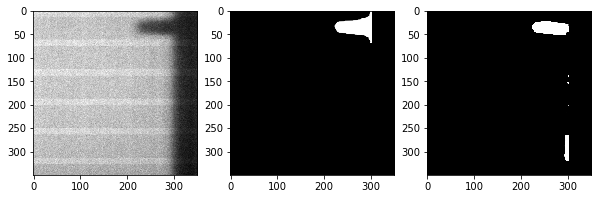

batch 2
1: true_dist: 30, pred_dist: [0.3931624]


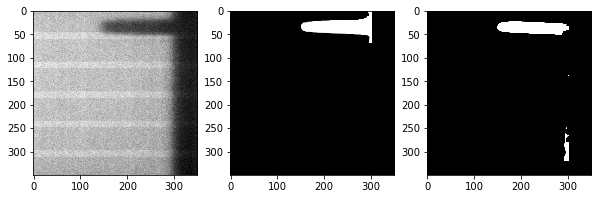

Trained_rUNet_pytorch_6positions_dataset_65epochs_0.4coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 3, pred_dist: [0.30961516]


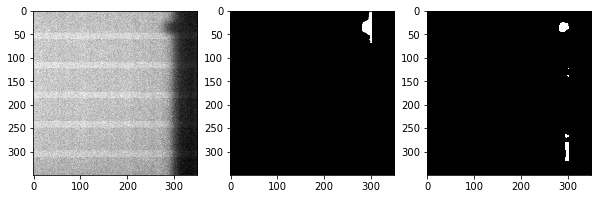

batch 2
1: true_dist: 1, pred_dist: [0.3764959]


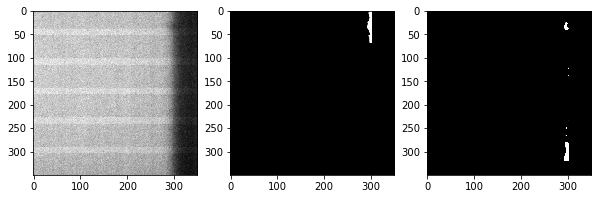

Trained_rUNet_pytorch_6positions_dataset_70epochs_0.4coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 15, pred_dist: [0.51256776]


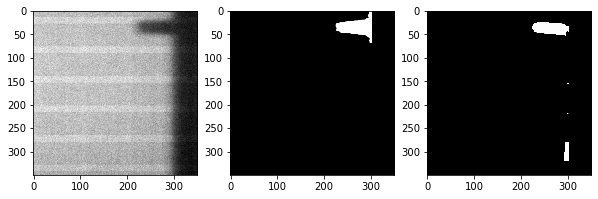

batch 2
1: true_dist: 3, pred_dist: [0.6319542]


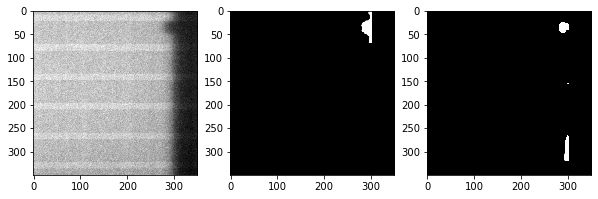

Trained_rUNet_pytorch_6positions_dataset_75epochs_0.4coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 30, pred_dist: [0.43139067]





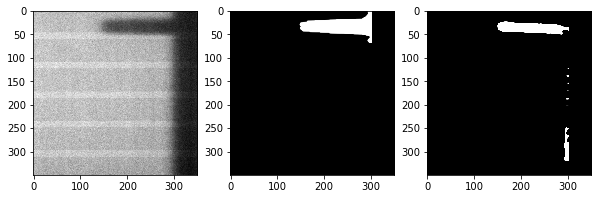

batch 2
1: true_dist: 15, pred_dist: [0.5361104]


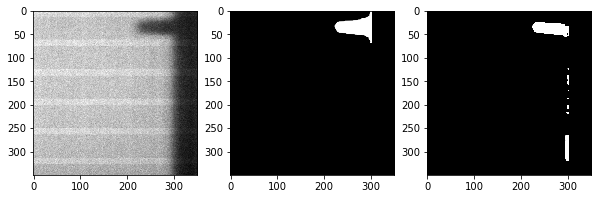

Trained_rUNet_pytorch_6positions_dataset_80epochs_0.4coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 30, pred_dist: [0.6548396]


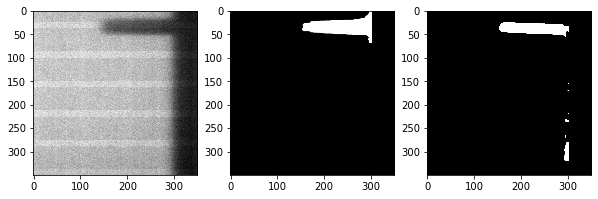

batch 2
1: true_dist: 30, pred_dist: [0.52264863]


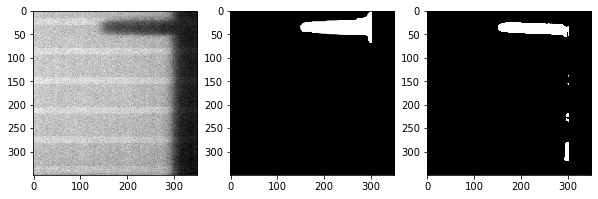

Trained_rUNet_pytorch_6positions_dataset_85epochs_0.4coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 30, pred_dist: [0.83391345]


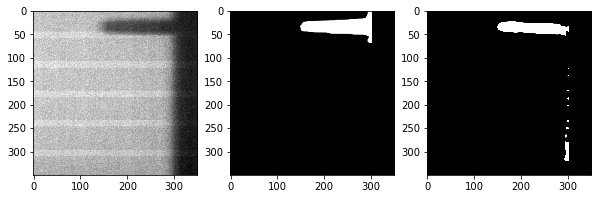

batch 2
1: true_dist: 3, pred_dist: [1.5064805]


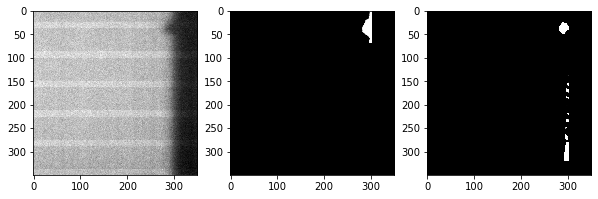

Trained_rUNet_pytorch_6positions_dataset_90epochs_0.4coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 30, pred_dist: [1.10284]


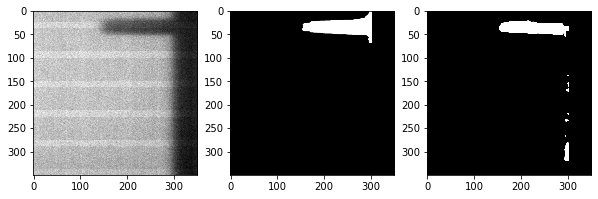

batch 2
1: true_dist: 3, pred_dist: [1.6178958]


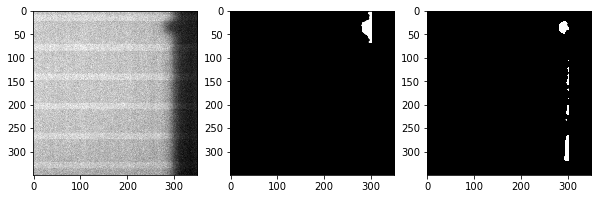

Trained_rUNet_pytorch_6positions_dataset_95epochs_0.4coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 3, pred_dist: [1.6872287]



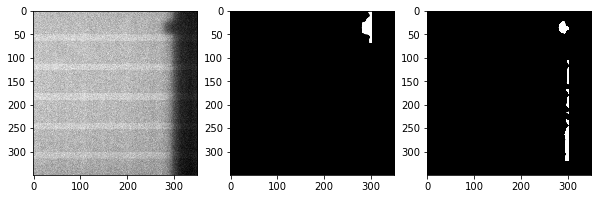

batch 2
1: true_dist: 3, pred_dist: [1.8488979]


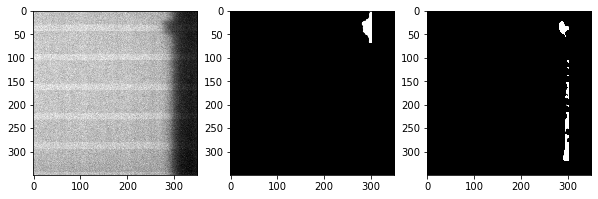

Trained_rUNet_pytorch_6positions_dataset_100epochs_0.4coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 30, pred_dist: [1.4987996]


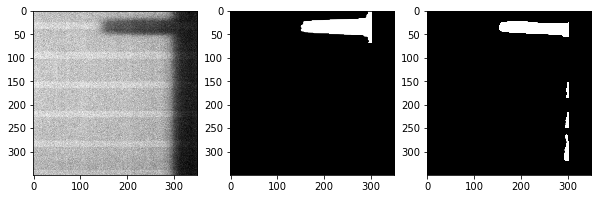

batch 2
1: true_dist: 1, pred_dist: [1.9511793]


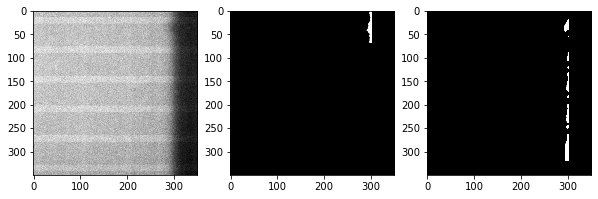

In [28]:
for ep in range(5, 105, 5):
    predict_coef_epoch(coeff=4, epoch=ep)

Trained_rUNet_pytorch_6positions_dataset_5epochs_0.7coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 15, pred_dist: [5.0201855]


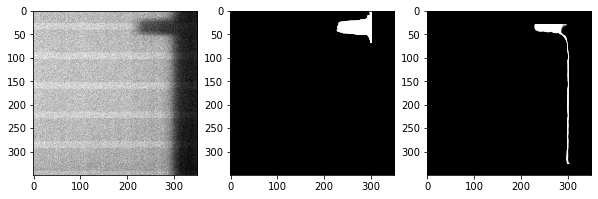

batch 2
1: true_dist: 15, pred_dist: [5.120485]


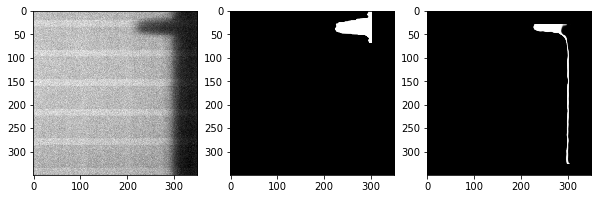

Trained_rUNet_pytorch_6positions_dataset_10epochs_0.7coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 1, pred_dist: [4.449994]


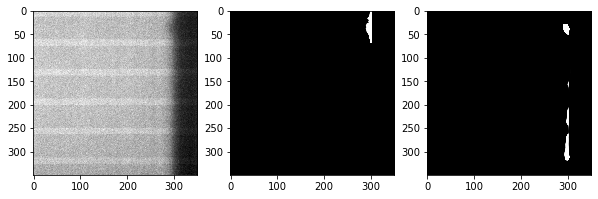

batch 2
1: true_dist: 30, pred_dist: [3.9951344]


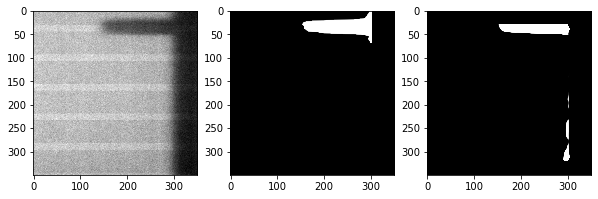

Trained_rUNet_pytorch_6positions_dataset_15epochs_0.7coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 30, pred_dist: [3.9109929]




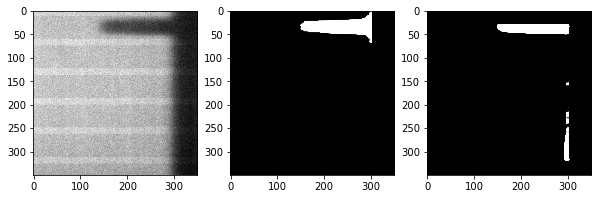

batch 2
1: true_dist: 1, pred_dist: [4.0514936]


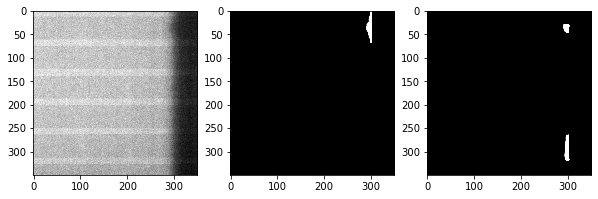

Trained_rUNet_pytorch_6positions_dataset_20epochs_0.7coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 1, pred_dist: [3.4220774]


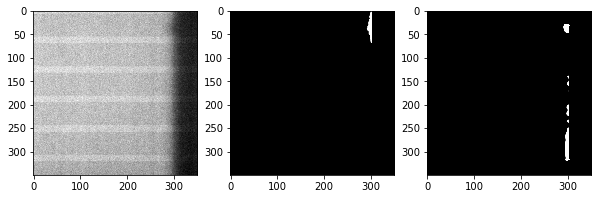

batch 2
1: true_dist: 30, pred_dist: [3.1383014]


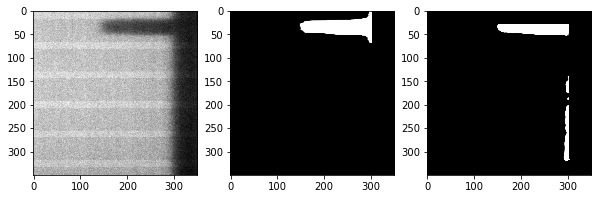

Trained_rUNet_pytorch_6positions_dataset_25epochs_0.7coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 15, pred_dist: [2.7687495]


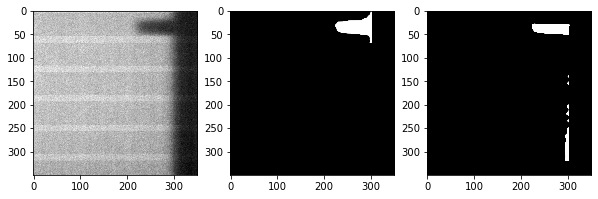

batch 2
1: true_dist: 1, pred_dist: [2.9937646]


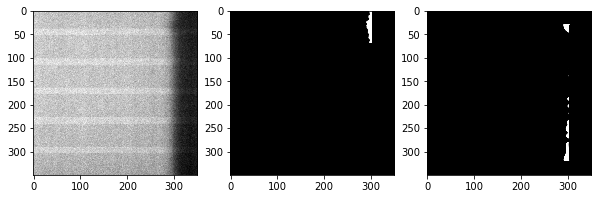

Trained_rUNet_pytorch_6positions_dataset_30epochs_0.7coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 30, pred_dist: [2.1557384]


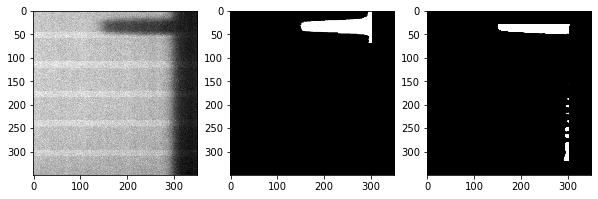

batch 2
1: true_dist: 15, pred_dist: [2.3909502]


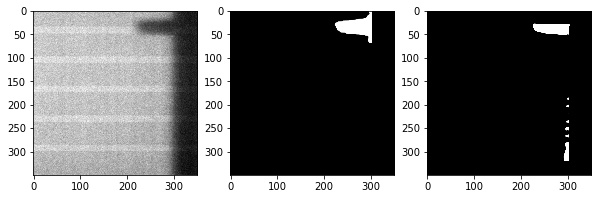

Trained_rUNet_pytorch_6positions_dataset_35epochs_0.7coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 3, pred_dist: [2.2796476]



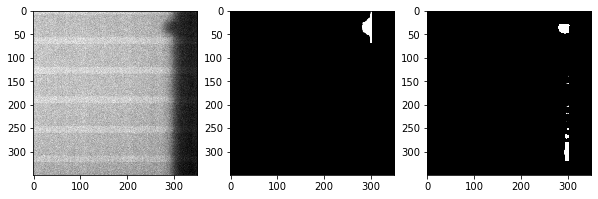

batch 2
1: true_dist: 30, pred_dist: [1.7295338]


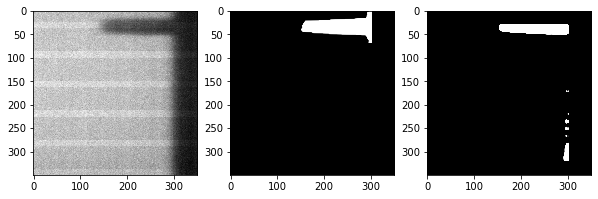

Trained_rUNet_pytorch_6positions_dataset_40epochs_0.7coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 30, pred_dist: [1.544417]


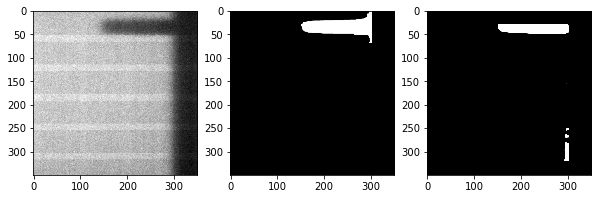

batch 2
1: true_dist: 30, pred_dist: [1.4827223]


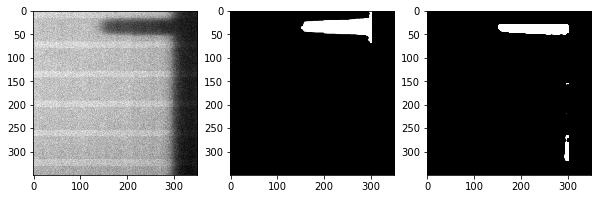

Trained_rUNet_pytorch_6positions_dataset_45epochs_0.7coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 15, pred_dist: [1.5333192]


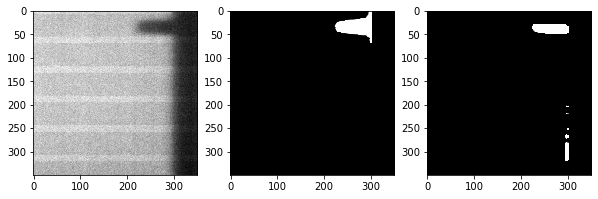

batch 2
1: true_dist: 30, pred_dist: [1.3119993]


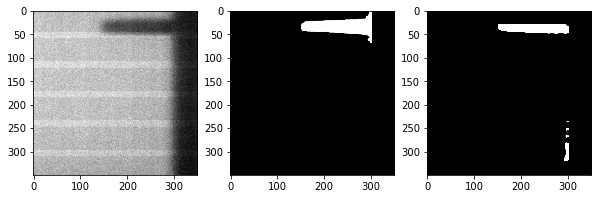

Trained_rUNet_pytorch_6positions_dataset_50epochs_0.7coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 15, pred_dist: [1.4056522]


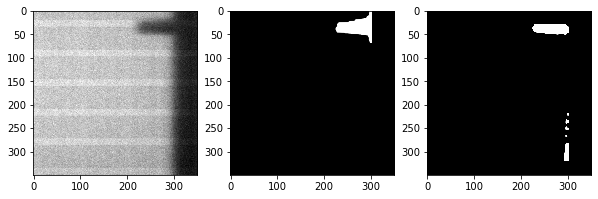

batch 2
1: true_dist: 3, pred_dist: [1.5612786]


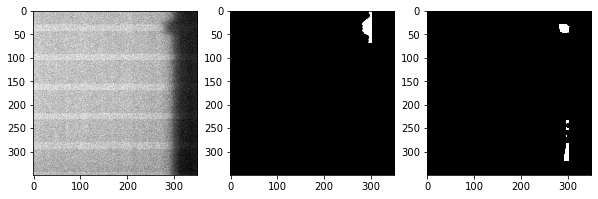

Trained_rUNet_pytorch_6positions_dataset_55epochs_0.7coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 15, pred_dist: [1.0758548]






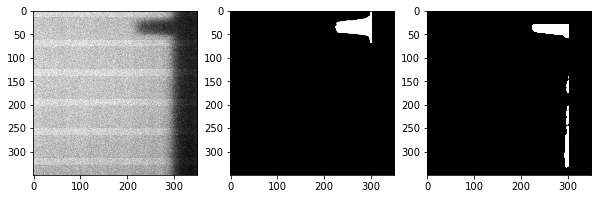

batch 2
1: true_dist: 1, pred_dist: [1.2314839]


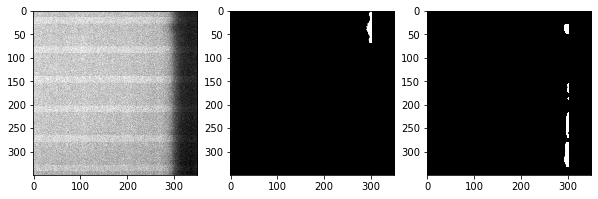

Trained_rUNet_pytorch_6positions_dataset_60epochs_0.7coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 15, pred_dist: [1.1770674]


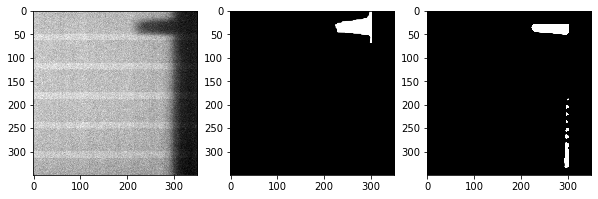

batch 2
1: true_dist: 30, pred_dist: [0.918753]


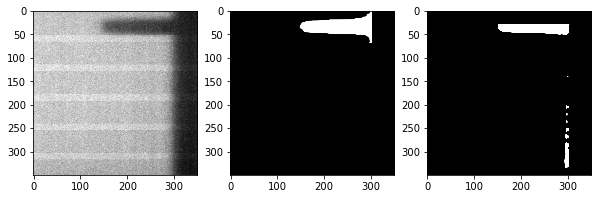

Trained_rUNet_pytorch_6positions_dataset_65epochs_0.7coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 1, pred_dist: [1.200202]


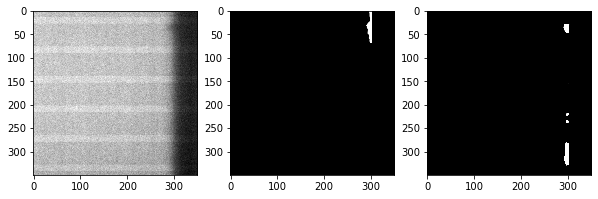

batch 2
1: true_dist: 15, pred_dist: [1.0308528]


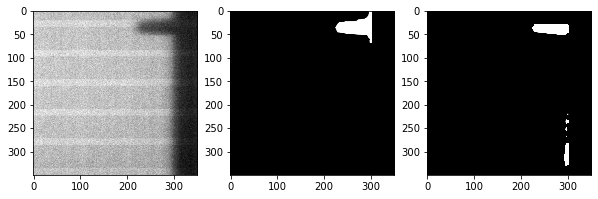

Trained_rUNet_pytorch_6positions_dataset_70epochs_0.7coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 3, pred_dist: [0.9302904]


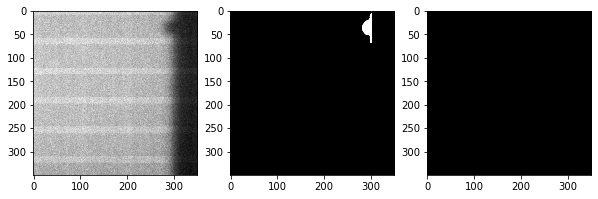

batch 2
1: true_dist: 15, pred_dist: [0.8428637]


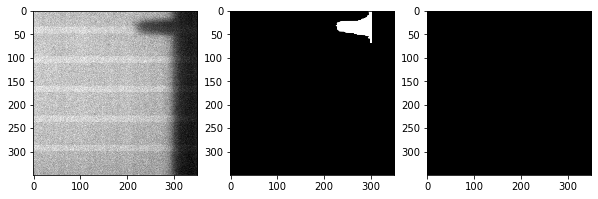

Trained_rUNet_pytorch_6positions_dataset_75epochs_0.7coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 15, pred_dist: [0.9112379]




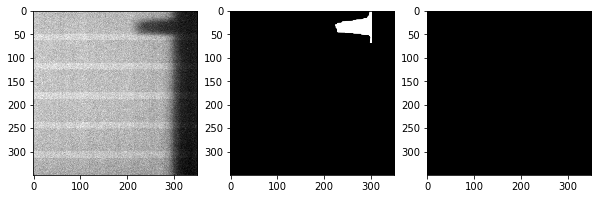

batch 2
1: true_dist: 1, pred_dist: [1.1300755]


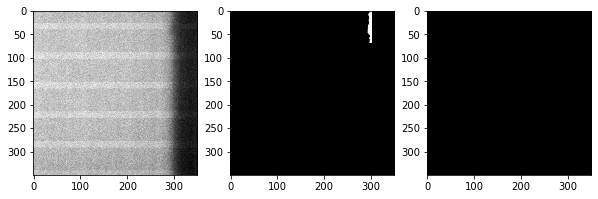

Trained_rUNet_pytorch_6positions_dataset_80epochs_0.7coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 1, pred_dist: [1.1035581]


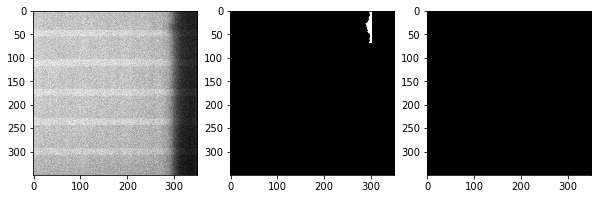

batch 2
1: true_dist: 15, pred_dist: [0.93827873]


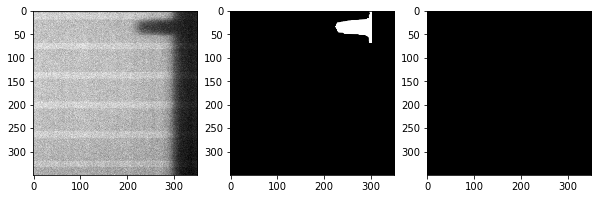

Trained_rUNet_pytorch_6positions_dataset_85epochs_0.7coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 3, pred_dist: [1.0929472]


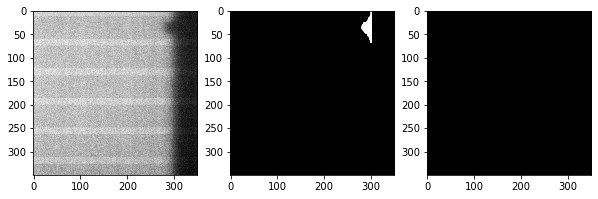

batch 2
1: true_dist: 3, pred_dist: [1.220245]


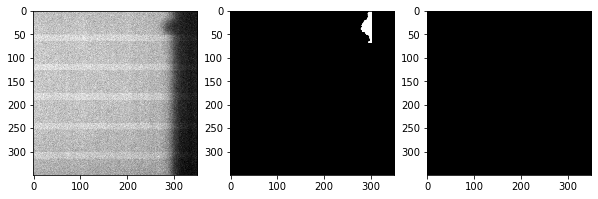

Trained_rUNet_pytorch_6positions_dataset_90epochs_0.7coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 1, pred_dist: [1.3893777]


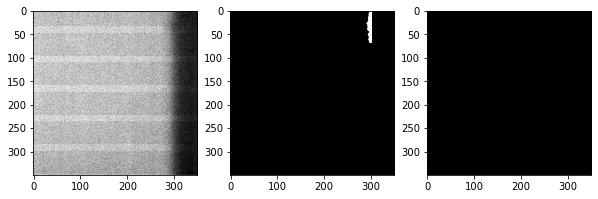

batch 2
1: true_dist: 15, pred_dist: [1.1031424]


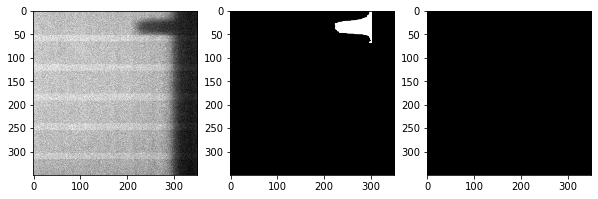

Trained_rUNet_pytorch_6positions_dataset_95epochs_0.7coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 30, pred_dist: [1.0836855]






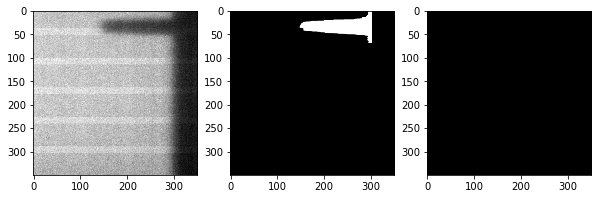

batch 2
1: true_dist: 1, pred_dist: [1.2844198]


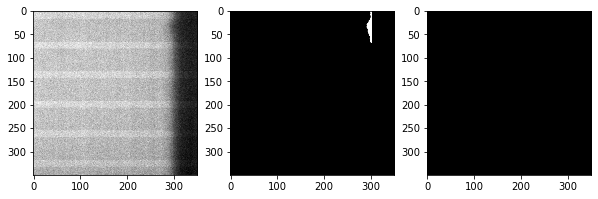

Trained_rUNet_pytorch_6positions_dataset_100epochs_0.7coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 1, pred_dist: [1.3940799]


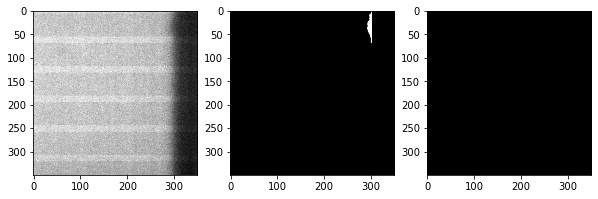

batch 2
1: true_dist: 3, pred_dist: [1.3768857]


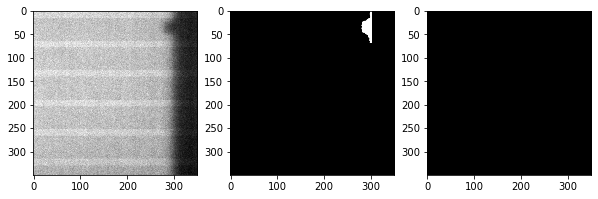

In [29]:
for ep in range(5, 105, 5):
    predict_coef_epoch(coeff=7, epoch=ep)

Trained_rUNet_pytorch_6positions_dataset_5epochs_0.75coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 30, pred_dist: [17.57541]


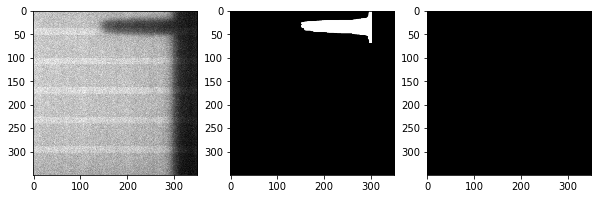

batch 2
1: true_dist: 30, pred_dist: [17.575657]


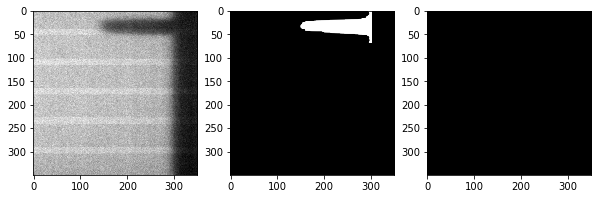

Trained_rUNet_pytorch_6positions_dataset_10epochs_0.75coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 15, pred_dist: [3.9567144]


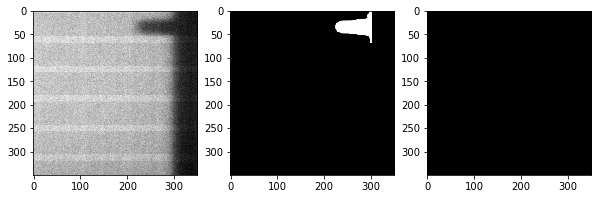

batch 2
1: true_dist: 15, pred_dist: [3.8339581]


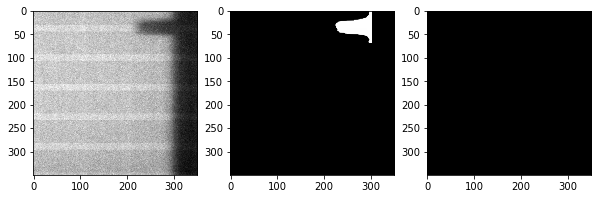

Trained_rUNet_pytorch_6positions_dataset_15epochs_0.75coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 30, pred_dist: [3.3368733]



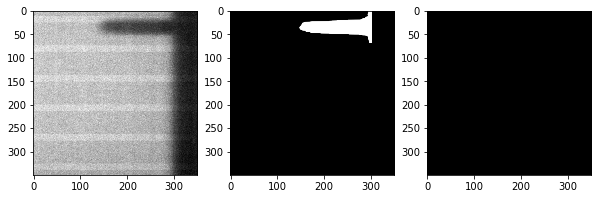

batch 2
1: true_dist: 1, pred_dist: [3.156582]


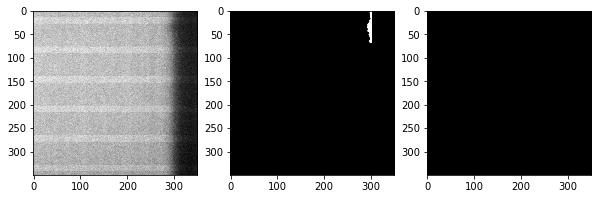

Trained_rUNet_pytorch_6positions_dataset_20epochs_0.75coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 30, pred_dist: [2.427293]


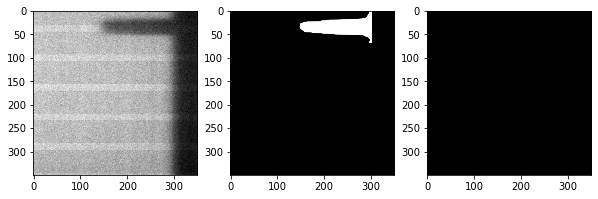

batch 2
1: true_dist: 30, pred_dist: [2.4262702]


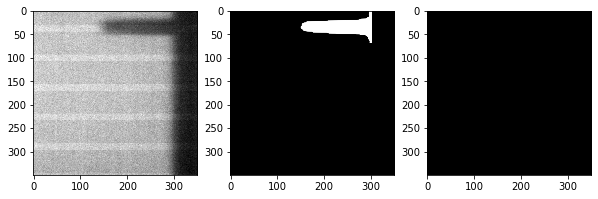

Trained_rUNet_pytorch_6positions_dataset_25epochs_0.75coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 1, pred_dist: [2.448328]


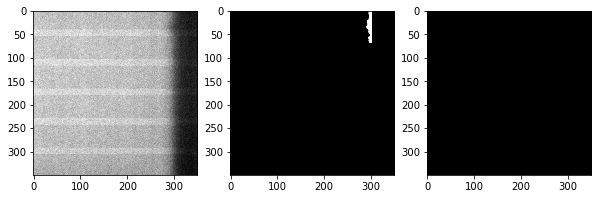

batch 2
1: true_dist: 30, pred_dist: [2.0105665]


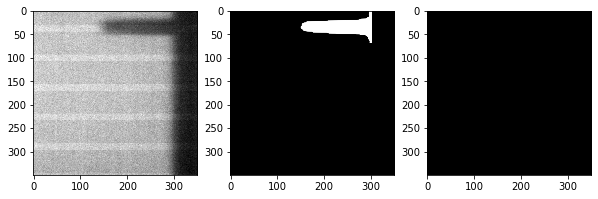

Trained_rUNet_pytorch_6positions_dataset_30epochs_0.75coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 3, pred_dist: [2.0628207]


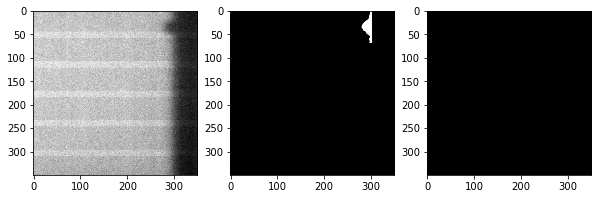

batch 2
1: true_dist: 30, pred_dist: [2.1213057]


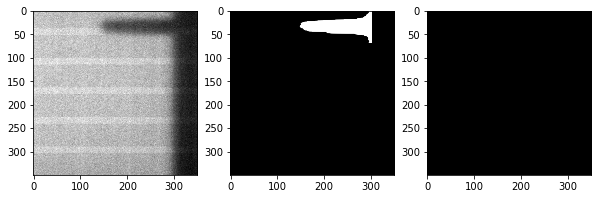

Trained_rUNet_pytorch_6positions_dataset_35epochs_0.75coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 1, pred_dist: [1.448998]






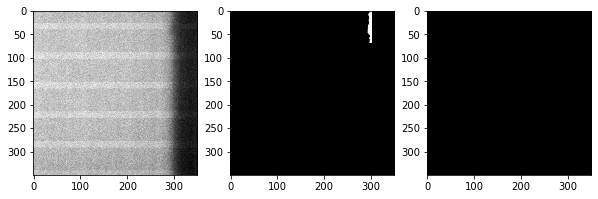

batch 2
1: true_dist: 1, pred_dist: [1.6044488]


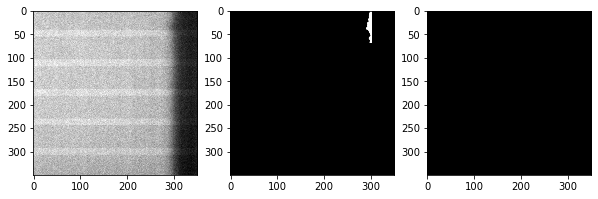

Trained_rUNet_pytorch_6positions_dataset_40epochs_0.75coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 1, pred_dist: [1.3290797]


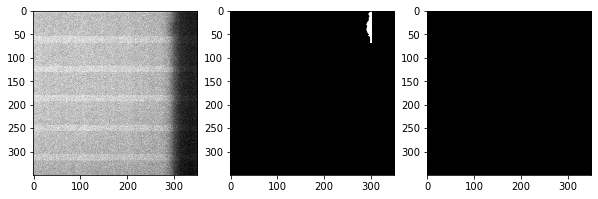

batch 2
1: true_dist: 30, pred_dist: [0.9282508]


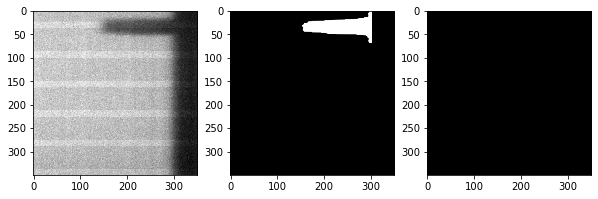

Trained_rUNet_pytorch_6positions_dataset_45epochs_0.75coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 30, pred_dist: [0.9193164]


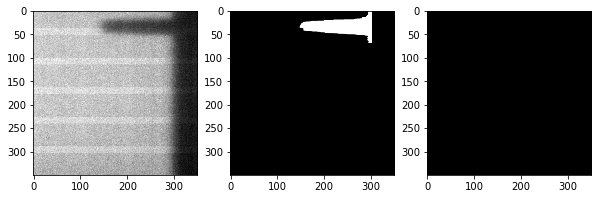

batch 2
1: true_dist: 30, pred_dist: [0.9381978]


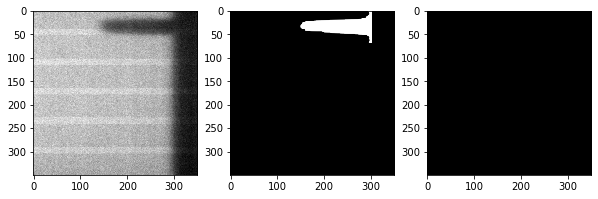

Trained_rUNet_pytorch_6positions_dataset_50epochs_0.75coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 1, pred_dist: [0.9048749]


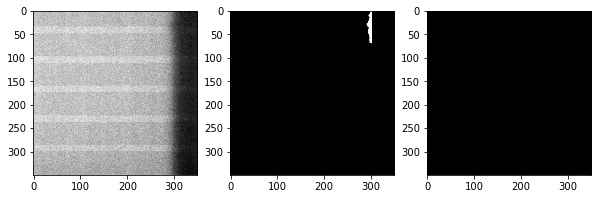

batch 2
1: true_dist: 15, pred_dist: [0.9208913]


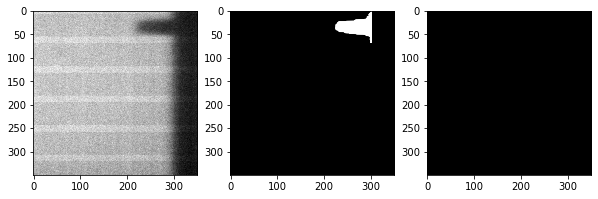

Trained_rUNet_pytorch_6positions_dataset_55epochs_0.75coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 30, pred_dist: [0.8033811]




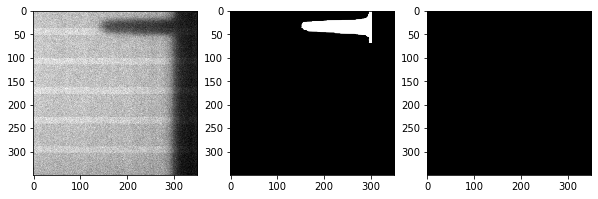

batch 2
1: true_dist: 15, pred_dist: [0.8910716]


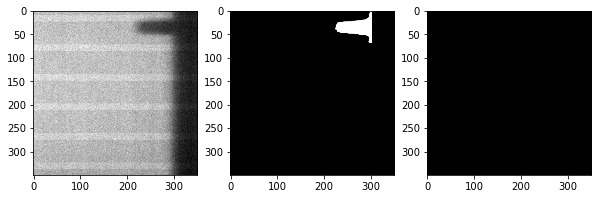

Trained_rUNet_pytorch_6positions_dataset_60epochs_0.75coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 15, pred_dist: [0.7602107]


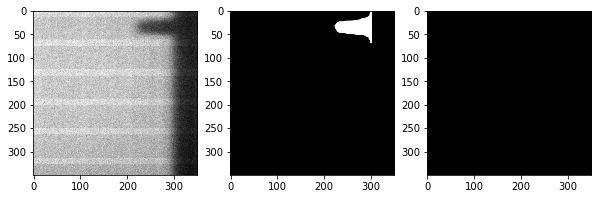

batch 2
1: true_dist: 30, pred_dist: [0.56746715]


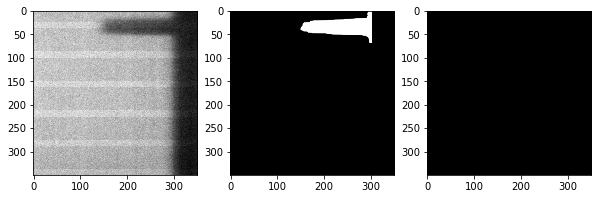

Trained_rUNet_pytorch_6positions_dataset_65epochs_0.75coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 30, pred_dist: [0.53297675]


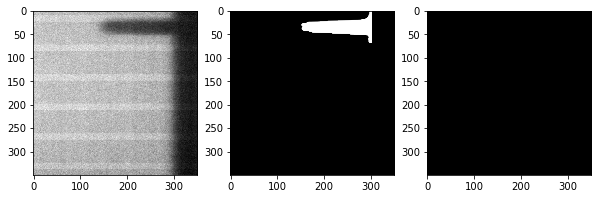

batch 2
1: true_dist: 1, pred_dist: [0.7302073]


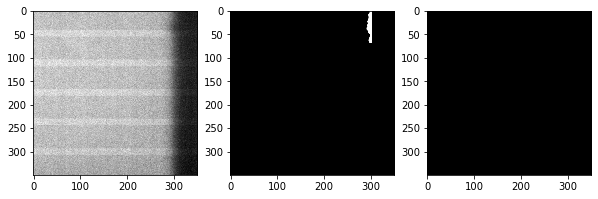

Trained_rUNet_pytorch_6positions_dataset_70epochs_0.75coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 30, pred_dist: [0.53423345]


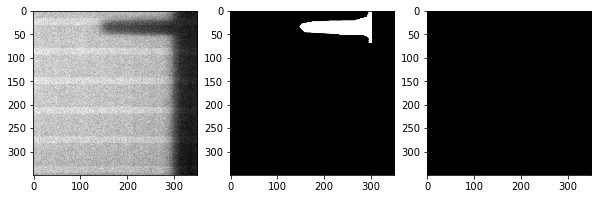

batch 2
1: true_dist: 30, pred_dist: [0.61654127]


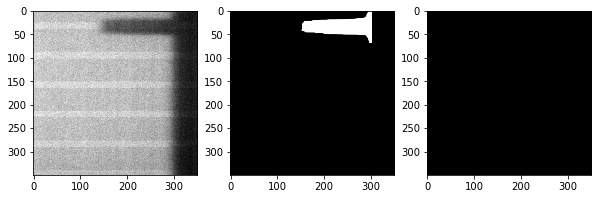

Trained_rUNet_pytorch_6positions_dataset_75epochs_0.75coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 15, pred_dist: [0.6127748]






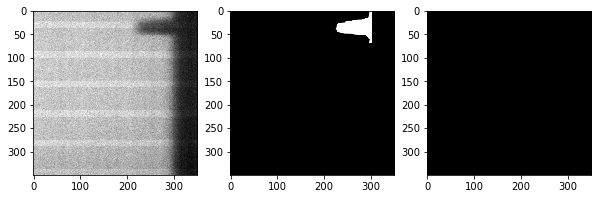

batch 2
1: true_dist: 15, pred_dist: [0.5951387]


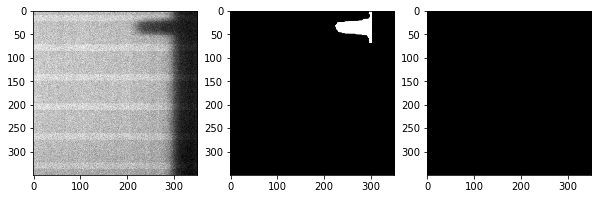

Trained_rUNet_pytorch_6positions_dataset_80epochs_0.75coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 30, pred_dist: [0.42856264]


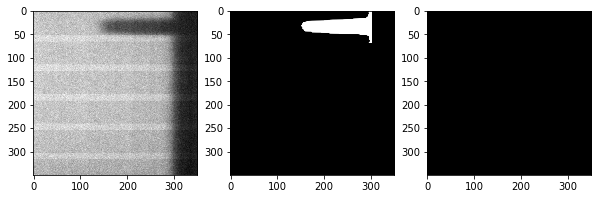

batch 2
1: true_dist: 15, pred_dist: [0.50789195]


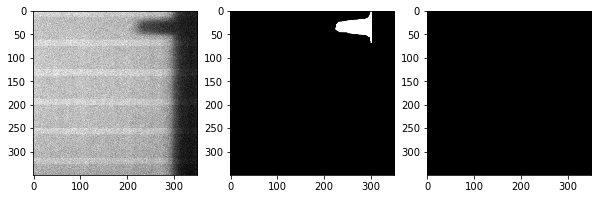

Trained_rUNet_pytorch_6positions_dataset_85epochs_0.75coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 1, pred_dist: [0.49229434]


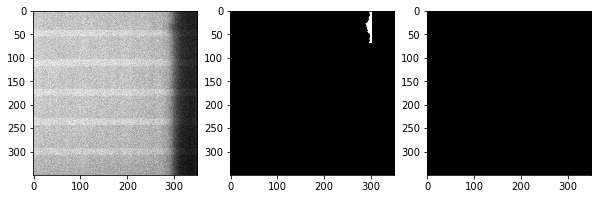

batch 2
1: true_dist: 3, pred_dist: [0.59676653]


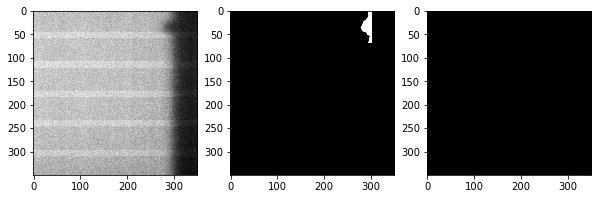

Trained_rUNet_pytorch_6positions_dataset_90epochs_0.75coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 1, pred_dist: [0.9527928]


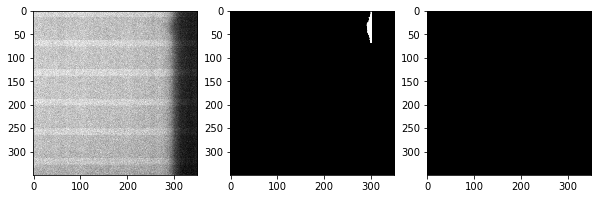

batch 2
1: true_dist: 1, pred_dist: [1.3112519]


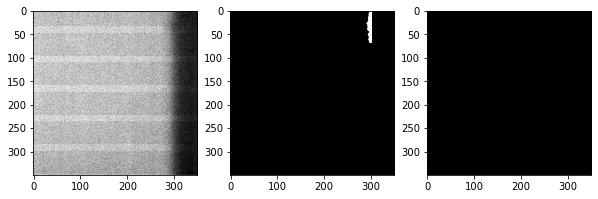

Trained_rUNet_pytorch_6positions_dataset_95epochs_0.75coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 3, pred_dist: [1.220613]





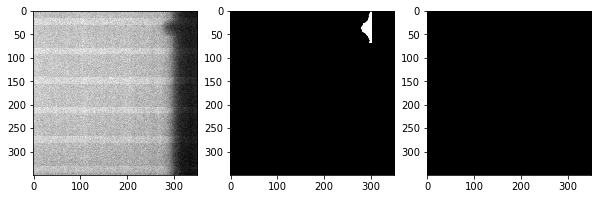

batch 2
1: true_dist: 15, pred_dist: [0.96735775]


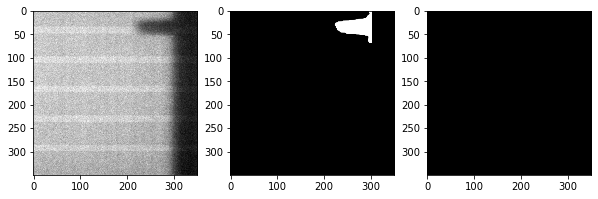

Trained_rUNet_pytorch_6positions_dataset_100epochs_0.75coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 3, pred_dist: [1.3358076]


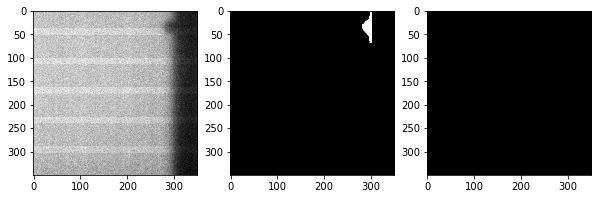

batch 2
1: true_dist: 15, pred_dist: [1.2123104]


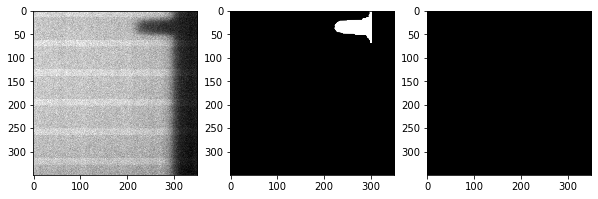

In [30]:
for ep in range(5, 105, 5):
    predict_coef_epoch(coeff=75, epoch=ep)

Trained_rUNet_pytorch_6positions_dataset_5epochs_0.6coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 15, pred_dist: [4.4404407]


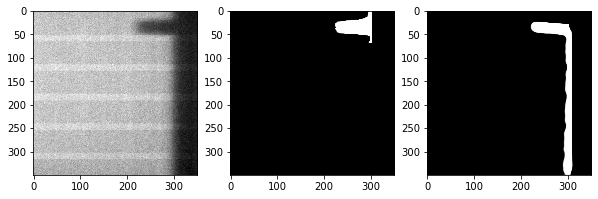

batch 2
1: true_dist: 15, pred_dist: [4.322465]


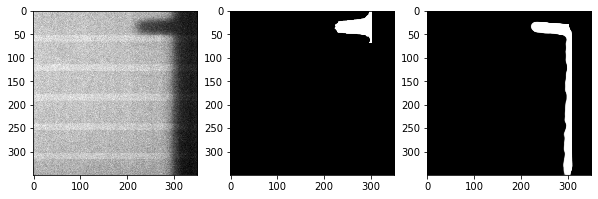

Trained_rUNet_pytorch_6positions_dataset_10epochs_0.6coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 1, pred_dist: [3.9608636]


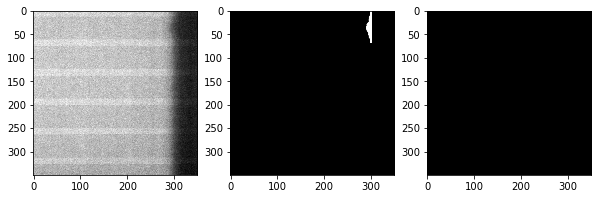

batch 2
1: true_dist: 3, pred_dist: [4.1810203]


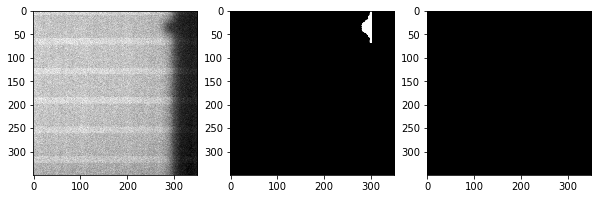

Trained_rUNet_pytorch_6positions_dataset_15epochs_0.6coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 15, pred_dist: [3.1758878]




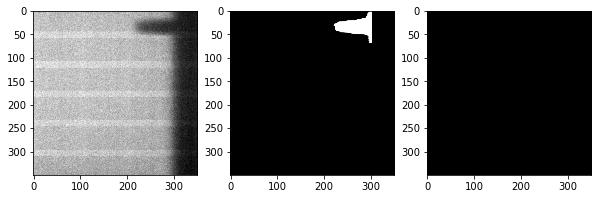

batch 2
1: true_dist: 3, pred_dist: [3.2718713]


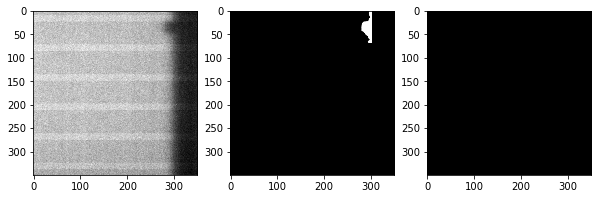

Trained_rUNet_pytorch_6positions_dataset_20epochs_0.6coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 15, pred_dist: [2.448595]


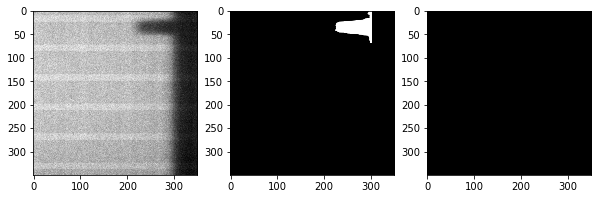

batch 2
1: true_dist: 15, pred_dist: [2.5164816]


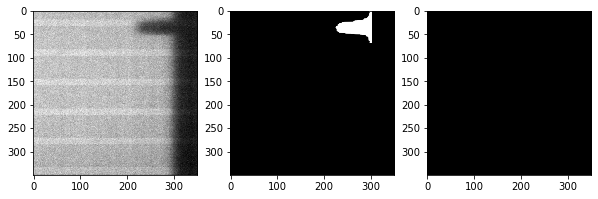

Trained_rUNet_pytorch_6positions_dataset_25epochs_0.6coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 30, pred_dist: [1.9995428]


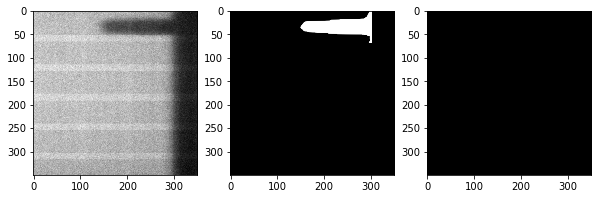

batch 2
1: true_dist: 1, pred_dist: [2.2897441]


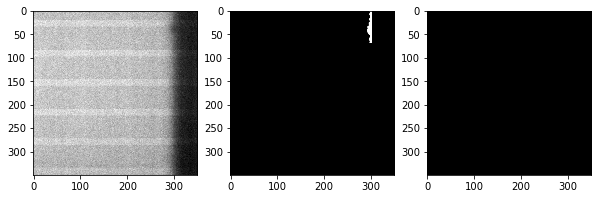

Trained_rUNet_pytorch_6positions_dataset_30epochs_0.6coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 30, pred_dist: [1.5699781]


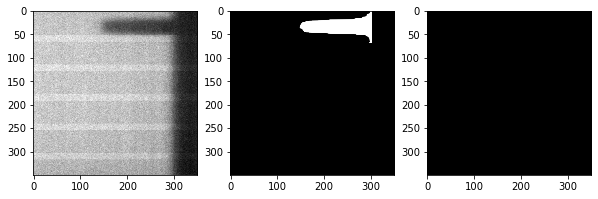

batch 2
1: true_dist: 3, pred_dist: [1.9781623]


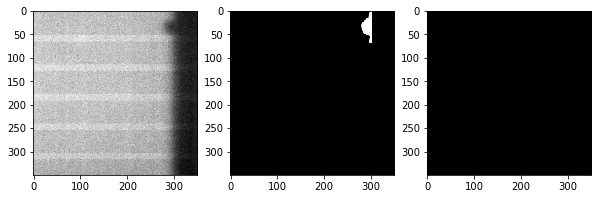

Trained_rUNet_pytorch_6positions_dataset_35epochs_0.6coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 1, pred_dist: [1.6714863]





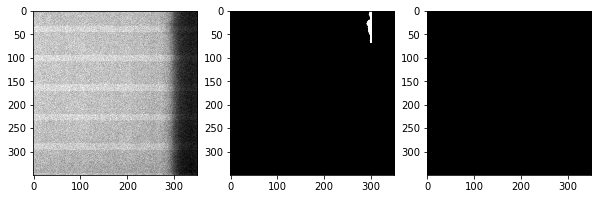

batch 2
1: true_dist: 1, pred_dist: [1.6014706]


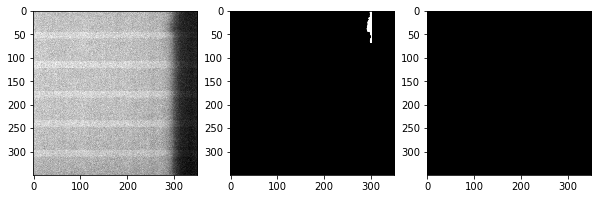

Trained_rUNet_pytorch_6positions_dataset_40epochs_0.6coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 30, pred_dist: [0.9804678]


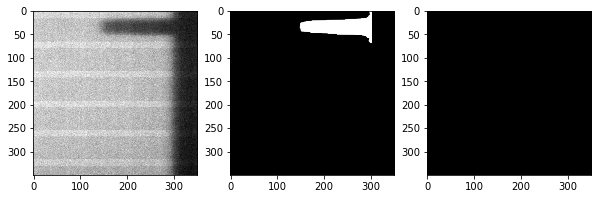

batch 2
1: true_dist: 30, pred_dist: [0.97144145]


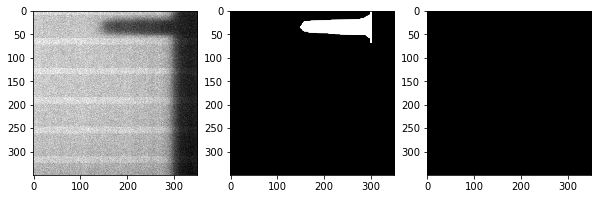

Trained_rUNet_pytorch_6positions_dataset_45epochs_0.6coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 15, pred_dist: [1.0960349]


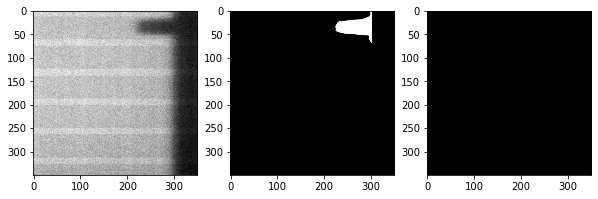

batch 2
1: true_dist: 30, pred_dist: [1.0093254]


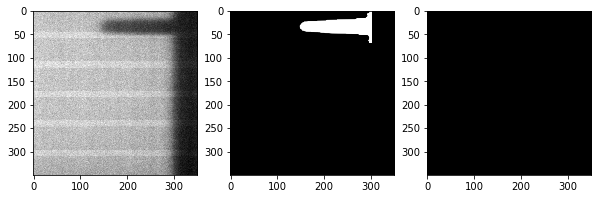

Trained_rUNet_pytorch_6positions_dataset_50epochs_0.6coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 15, pred_dist: [0.95161957]


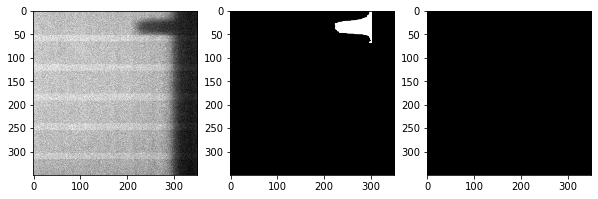

batch 2
1: true_dist: 1, pred_dist: [1.380628]


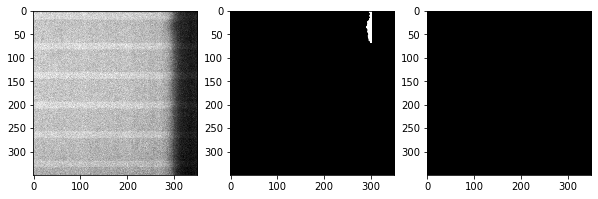

Trained_rUNet_pytorch_6positions_dataset_55epochs_0.6coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 1, pred_dist: [0.9955239]


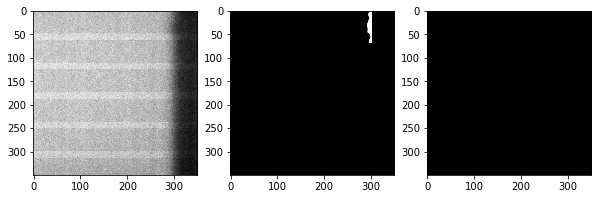

batch 2
1: true_dist: 1, pred_dist: [1.1347301]


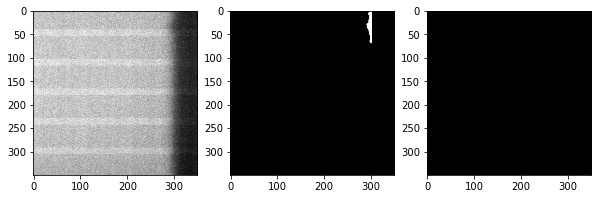

Trained_rUNet_pytorch_6positions_dataset_60epochs_0.6coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 15, pred_dist: [0.8144319]


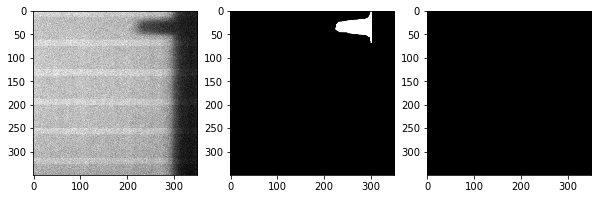

batch 2
1: true_dist: 15, pred_dist: [0.83801043]


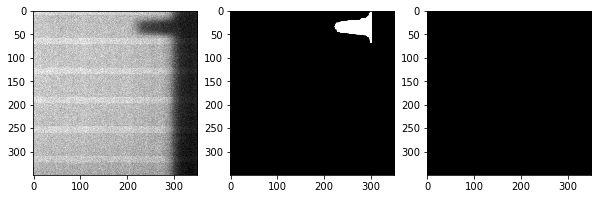

Trained_rUNet_pytorch_6positions_dataset_65epochs_0.6coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 30, pred_dist: [0.7337008]


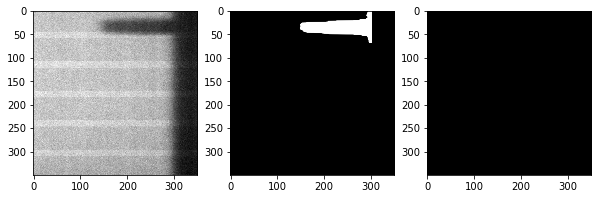

batch 2
1: true_dist: 3, pred_dist: [0.9335187]


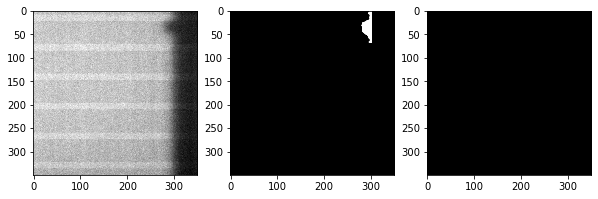

Trained_rUNet_pytorch_6positions_dataset_70epochs_0.6coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 1, pred_dist: [0.90162563]


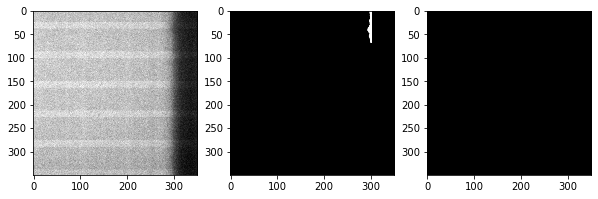

batch 2
1: true_dist: 15, pred_dist: [0.9597548]


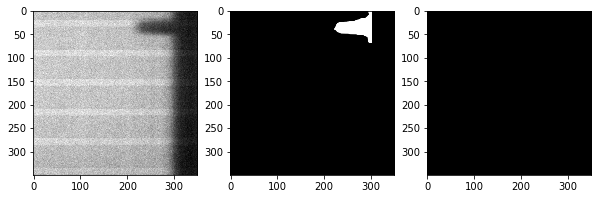

Trained_rUNet_pytorch_6positions_dataset_75epochs_0.6coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 1, pred_dist: [0.976627]






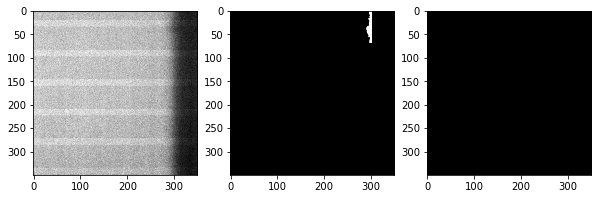

batch 2
1: true_dist: 30, pred_dist: [0.6648089]


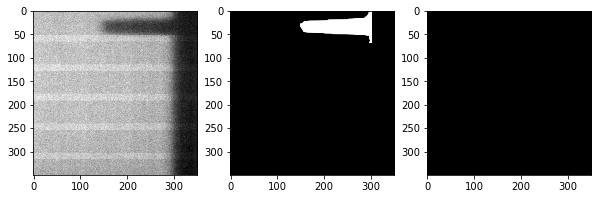

Trained_rUNet_pytorch_6positions_dataset_80epochs_0.6coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 3, pred_dist: [1.1466064]


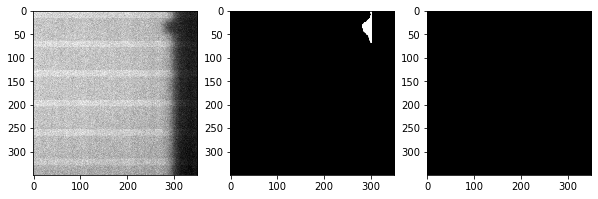

batch 2
1: true_dist: 1, pred_dist: [1.3817546]


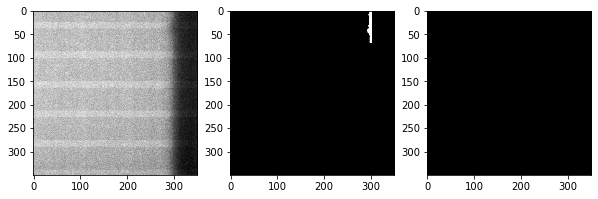

Trained_rUNet_pytorch_6positions_dataset_85epochs_0.6coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 30, pred_dist: [1.318358]


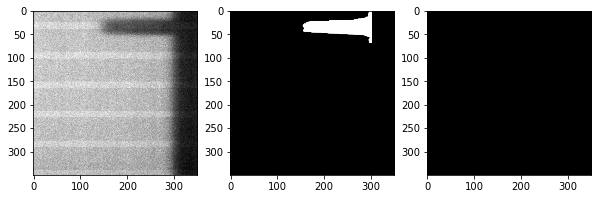

batch 2
1: true_dist: 3, pred_dist: [1.5737118]


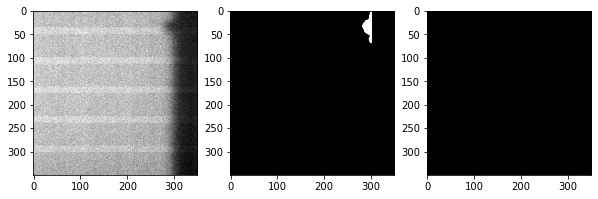

Trained_rUNet_pytorch_6positions_dataset_90epochs_0.6coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 15, pred_dist: [1.6603353]


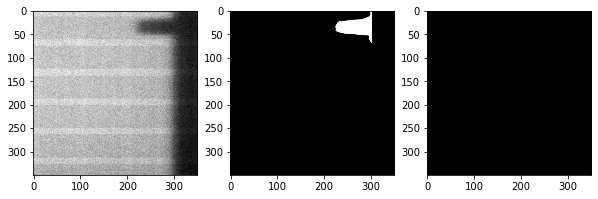

batch 2
1: true_dist: 15, pred_dist: [1.7649989]


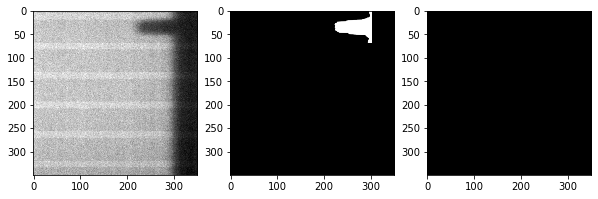

Trained_rUNet_pytorch_6positions_dataset_95epochs_0.6coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 15, pred_dist: [1.8941146]



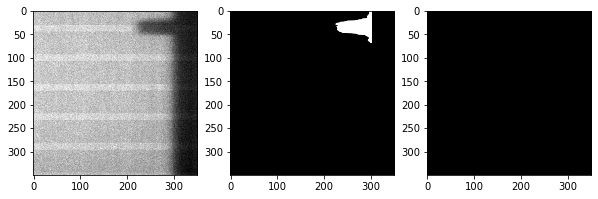

batch 2
1: true_dist: 30, pred_dist: [1.5697926]


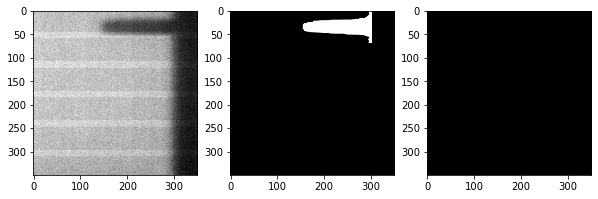

Trained_rUNet_pytorch_6positions_dataset_100epochs_0.6coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 30, pred_dist: [3.0637674]


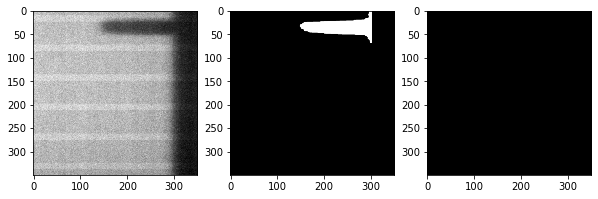

batch 2
1: true_dist: 15, pred_dist: [3.2896433]


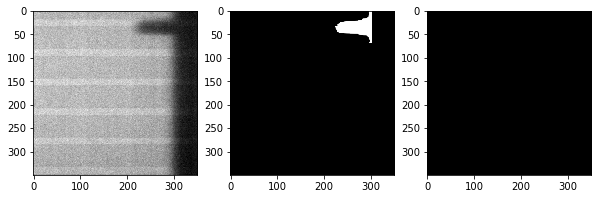

In [31]:
for ep in range(5, 105, 5):
    predict_coef_epoch(coeff=6, epoch=ep)

Trained_rUNet_pytorch_6positions_dataset_10epochs_0.5coeff_mask.pkl
Checkpoint loaded


batch 1
1: true_dist: 15, pred_dist: [5.281455]


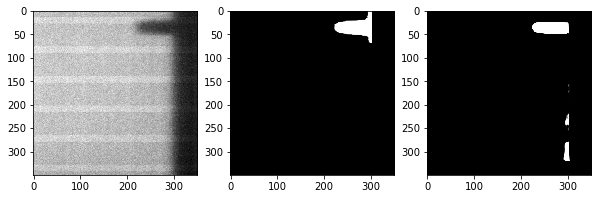

batch 2
1: true_dist: 3, pred_dist: [5.5874314]


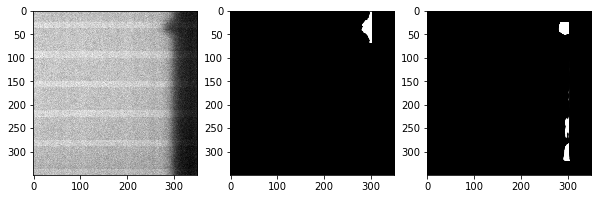

batch 3
1: true_dist: 15, pred_dist: [5.3325553]


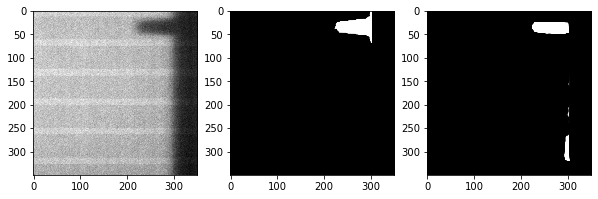

batch 4
1: true_dist: 3, pred_dist: [5.456856]


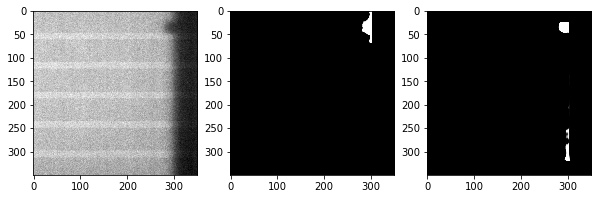

batch 5
1: true_dist: 30, pred_dist: [5.112523]


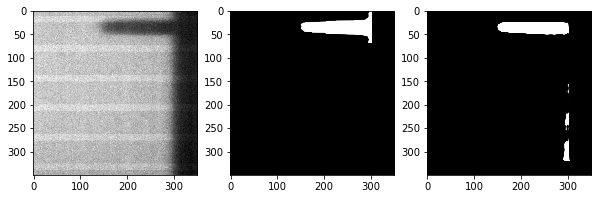

batch 6
1: true_dist: 15, pred_dist: [5.2694163]


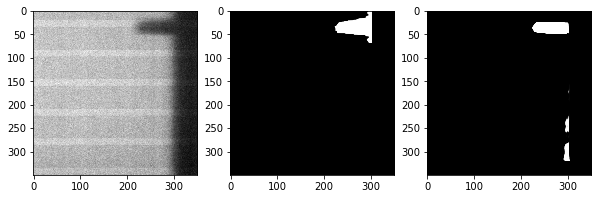

batch 7
1: true_dist: 30, pred_dist: [4.9981985]


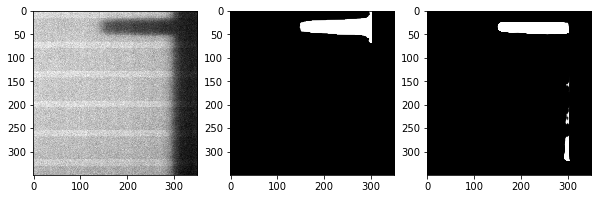

batch 8
1: true_dist: 15, pred_dist: [5.361477]


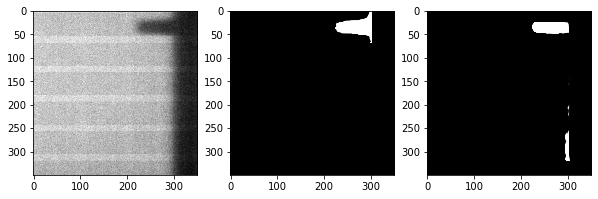

batch 9
1: true_dist: 1, pred_dist: [5.6081524]


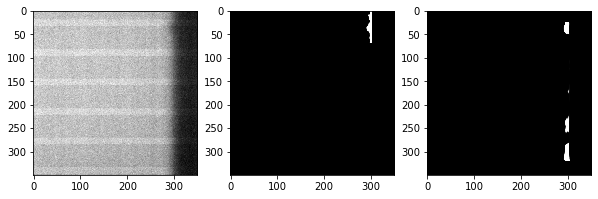

batch 10
1: true_dist: 1, pred_dist: [5.552505]


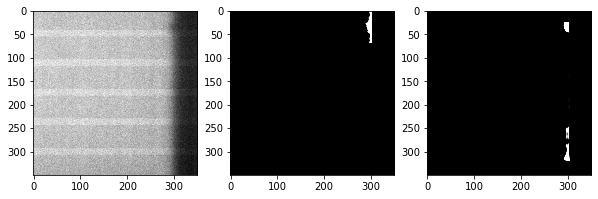

batch 11
1: true_dist: 15, pred_dist: [5.2803087]


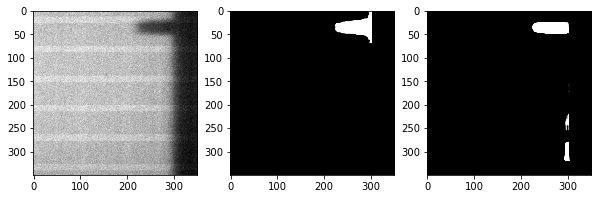

In [35]:
predict_coef_epoch(coeff=5, epoch=10)

In [ ]:
predict_coef_epoch(coeff=4, epoch=100)